## Interpolation

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas.plotting
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
%matplotlib inline

In [13]:
data = pd.read_csv(r"C:\Users\HP\Downloads\ee798q_ass\Open pit blasting.csv",index_col = 0, header = 0)

In [14]:
df = pd.DataFrame(data)

In [15]:
df.columns = [ 'From', 'To', 'PM10 (µg/m3)', 'PM2.5 (µg/m3)', 'NO (µg/m3)', 'NO2 (µg/m3)', 'NOX (ppb)', 'CO (mg/m3)', 'SO2 (µg/m3)', 'NH3 (µg/m3)', 'OZONE (µg/m3)', 'BENZENE (µg/m3)']

In [16]:
df = df[:-3]

In [17]:
df['From'] = pd.to_datetime(df['From'], format = '%Y-%m-%d %H:%M:%S')
df.drop(['To'], axis=1, inplace=True)
df.set_index(['From'], inplace = True)

In [18]:
df.isnull().sum()
#how many missing values in each column

PM10 (µg/m3)       1681
PM2.5 (µg/m3)       226
NO (µg/m3)         1369
NO2 (µg/m3)         416
NOX (ppb)           415
CO (mg/m3)          496
SO2 (µg/m3)        1451
NH3 (µg/m3)         326
OZONE (µg/m3)       453
BENZENE (µg/m3)    6195
dtype: int64

In [19]:
#conda install plotly

<IPython.core.display.Javascript object>


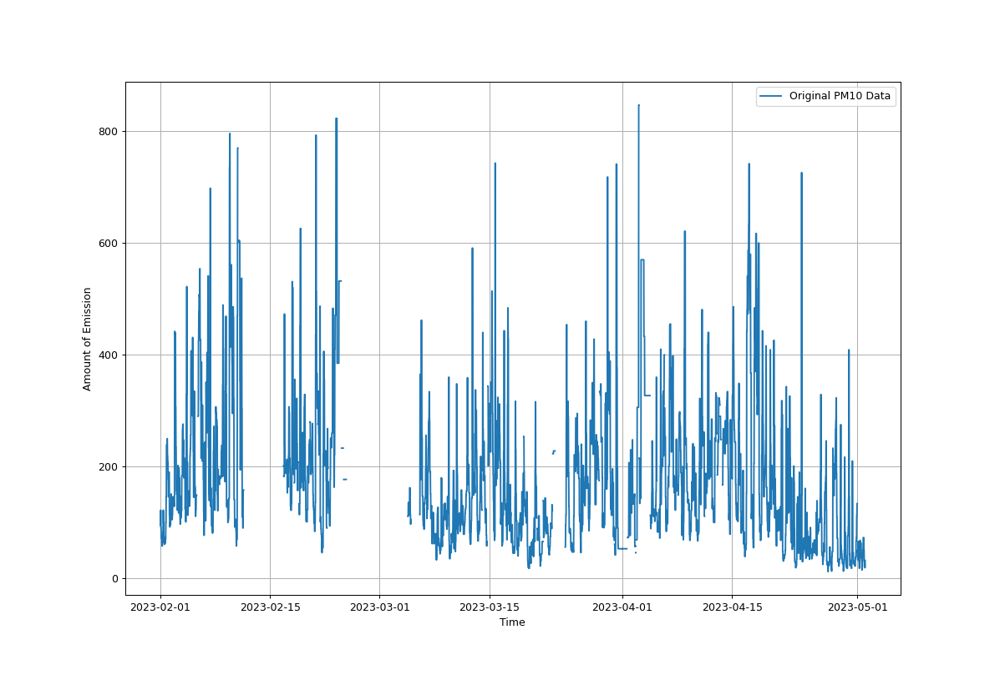

In [21]:
%matplotlib notebook
plt.plot(df.index, df['PM10 (µg/m3)'] , label='Original PM10 Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

We don't find any seasonality in the data of PM10 hence we can't replace with the previous month data, therefore we interpolate
through other techniques.

## Interpolation for PM10

In [26]:
#linear interpolation
new_df_PM10_l = df['PM10 (µg/m3)'].interpolate(method="linear")
new_df_PM10_l

From
2023-02-01 00:00:00     95.0
2023-02-01 00:15:00     95.0
2023-02-01 00:30:00     95.0
2023-02-01 00:45:00    122.0
2023-02-01 01:00:00    122.0
                       ...  
2023-05-01 22:45:00     19.0
2023-05-01 23:00:00     19.0
2023-05-01 23:15:00     19.0
2023-05-01 23:30:00     19.0
2023-05-01 23:45:00     32.0
Name: PM10 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


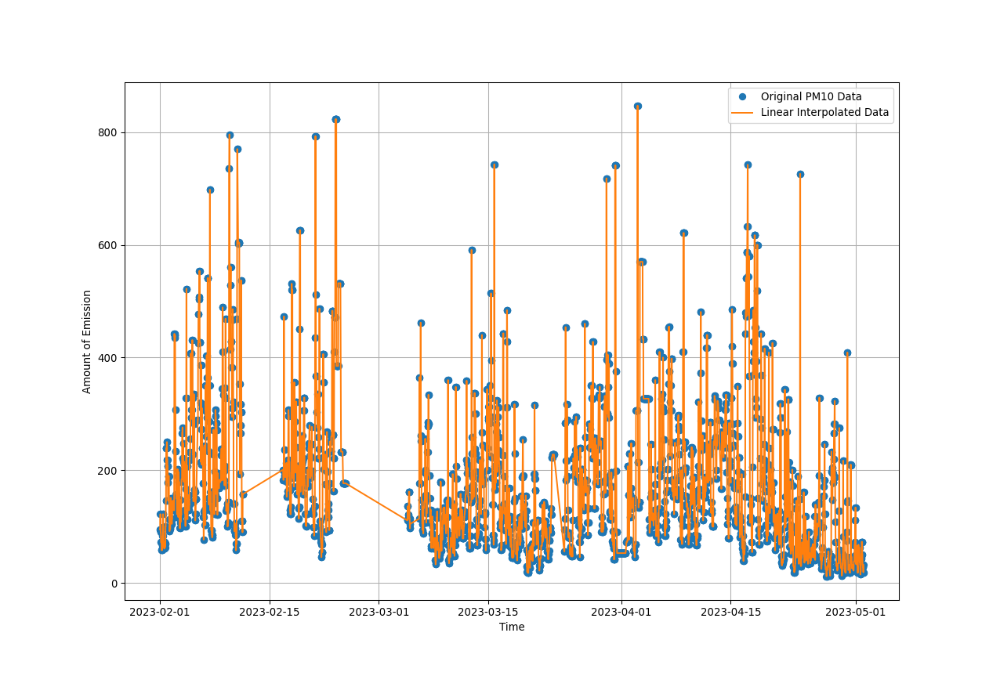

In [13]:
%matplotlib notebook
plt.plot(df.index, df['PM10 (µg/m3)'] , 'o', label='Original PM10 Data')
plt.plot(df.index , new_df_PM10_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [14]:
#cubic spline interpolation
spline_PM10 = df['PM10 (µg/m3)'].interpolate(method = "spline", order = 3)
spline_PM10

From
2023-02-01 00:00:00     95.0
2023-02-01 00:15:00     95.0
2023-02-01 00:30:00     95.0
2023-02-01 00:45:00    122.0
2023-02-01 01:00:00    122.0
                       ...  
2023-05-01 22:45:00     19.0
2023-05-01 23:00:00     19.0
2023-05-01 23:15:00     19.0
2023-05-01 23:30:00     19.0
2023-05-01 23:45:00     32.0
Name: PM10 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


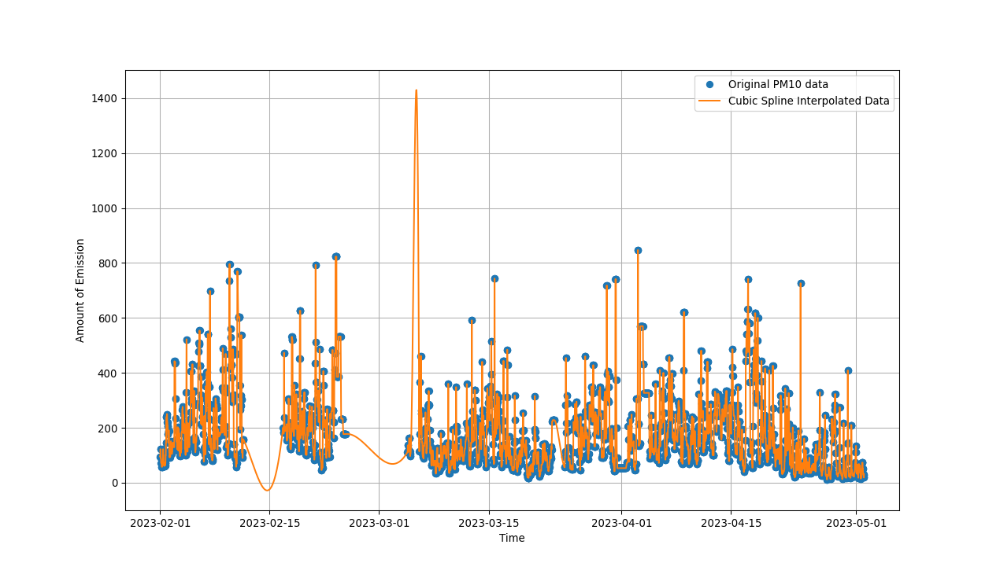

In [15]:
%matplotlib notebook
plt.plot(df.index, df['PM10 (µg/m3)'], 'o', label='Original PM10 data')
plt.plot(df.index, spline_PM10 , label='Cubic Spline Interpolated Data')
# plt.plot(time, new_df_PM10, label='Interpolated1')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [16]:
#cubic interpolation
new_df_PM10 = df['PM10 (µg/m3)'].interpolate(method="cubic")
new_df_PM10

From
2023-02-01 00:00:00     95.0
2023-02-01 00:15:00     95.0
2023-02-01 00:30:00     95.0
2023-02-01 00:45:00    122.0
2023-02-01 01:00:00    122.0
                       ...  
2023-05-01 22:45:00     19.0
2023-05-01 23:00:00     19.0
2023-05-01 23:15:00     19.0
2023-05-01 23:30:00     19.0
2023-05-01 23:45:00     32.0
Name: PM10 (µg/m3), Length: 8640, dtype: float64

In [17]:
new_df_PM10.isnull().sum()

0

<IPython.core.display.Javascript object>


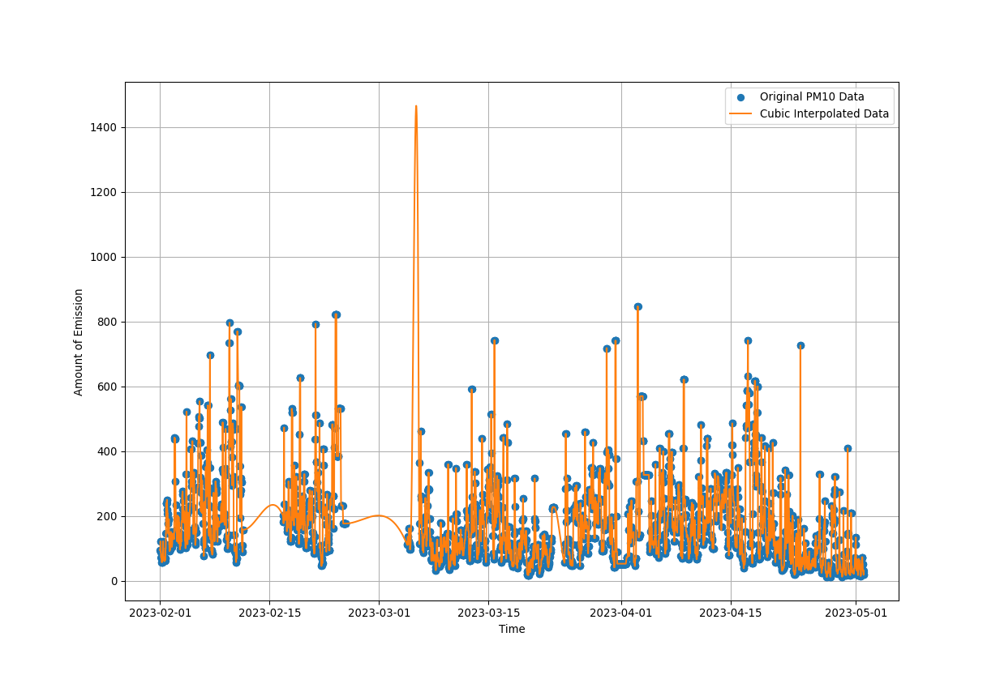

In [18]:
%matplotlib notebook
plt.plot(df.index, df['PM10 (µg/m3)'], 'o', label='Original PM10 Data')
plt.plot(df.index , new_df_PM10, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


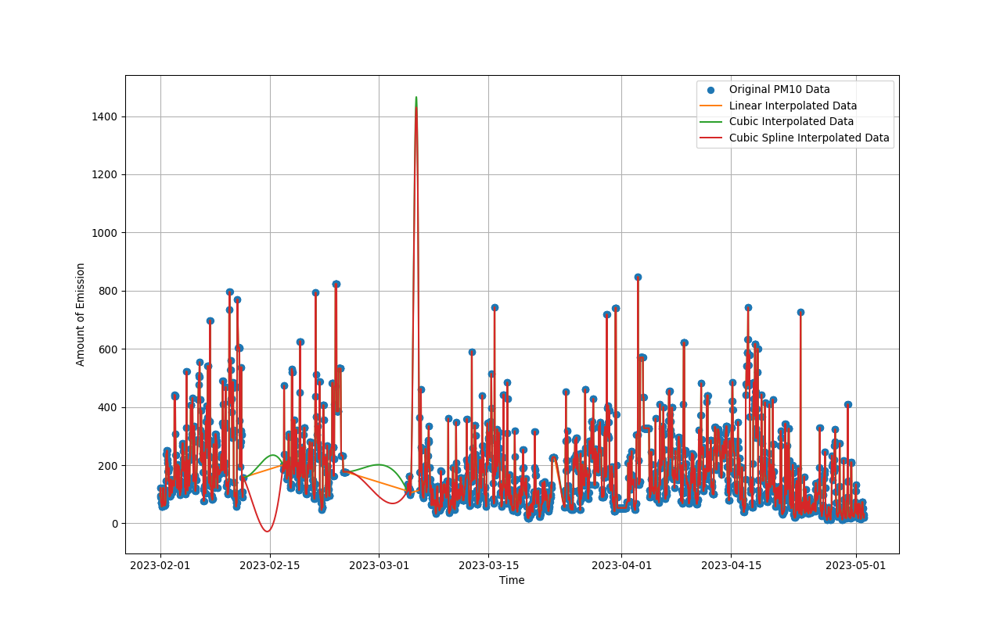

In [19]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['PM10 (µg/m3)'] , 'o', label='Original PM10 Data')
plt.plot(df.index , new_df_PM10_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_PM10, label='Cubic Interpolated Data')
plt.plot(df.index, spline_PM10 , label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Linear interpolation is the best for PM10 as cubic and spline cubic are giving abruptly high values at some points.

## Interpolation of PM2.5

In [27]:
#linear interpolation
new_df_PM25_l = df['PM2.5 (µg/m3)'].interpolate(method="linear")
new_df_PM25_l

From
2023-02-01 00:00:00    35.0
2023-02-01 00:15:00    35.0
2023-02-01 00:30:00    35.0
2023-02-01 00:45:00    34.0
2023-02-01 01:00:00    34.0
                       ... 
2023-05-01 22:45:00    11.0
2023-05-01 23:00:00    11.0
2023-05-01 23:15:00    11.0
2023-05-01 23:30:00    11.0
2023-05-01 23:45:00     6.0
Name: PM2.5 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


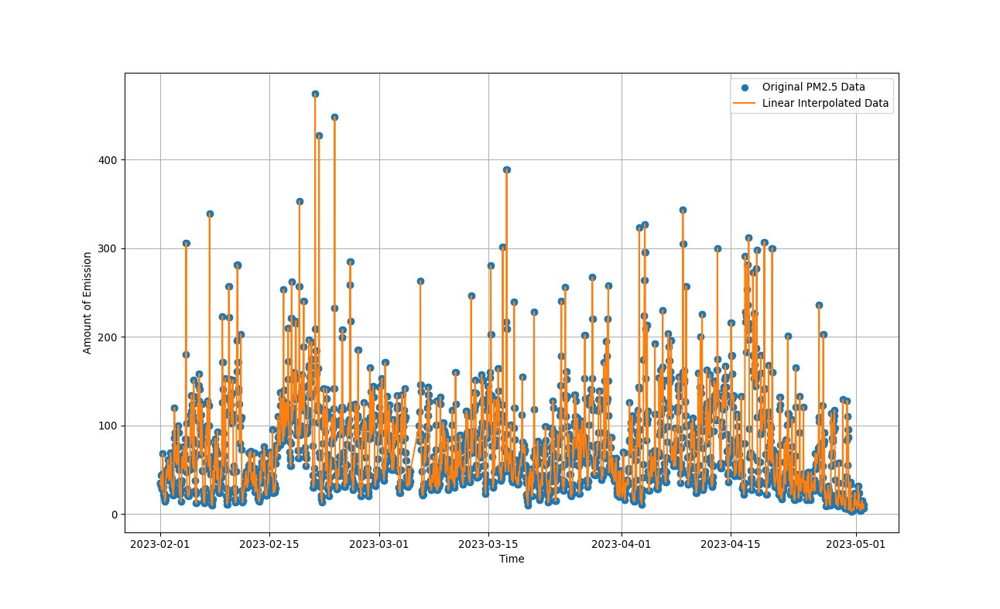

In [21]:
%matplotlib notebook
plt.plot(df.index, df['PM2.5 (µg/m3)'], 'o', label='Original PM2.5 Data')
plt.plot(df.index , new_df_PM25_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [28]:
#cubic interpolation
new_df_PM25 = df['PM2.5 (µg/m3)'].interpolate(method="cubic")
new_df_PM25

From
2023-02-01 00:00:00    35.0
2023-02-01 00:15:00    35.0
2023-02-01 00:30:00    35.0
2023-02-01 00:45:00    34.0
2023-02-01 01:00:00    34.0
                       ... 
2023-05-01 22:45:00    11.0
2023-05-01 23:00:00    11.0
2023-05-01 23:15:00    11.0
2023-05-01 23:30:00    11.0
2023-05-01 23:45:00     6.0
Name: PM2.5 (µg/m3), Length: 8640, dtype: float64

In [23]:
new_df_PM25.isnull().sum()

0

<IPython.core.display.Javascript object>


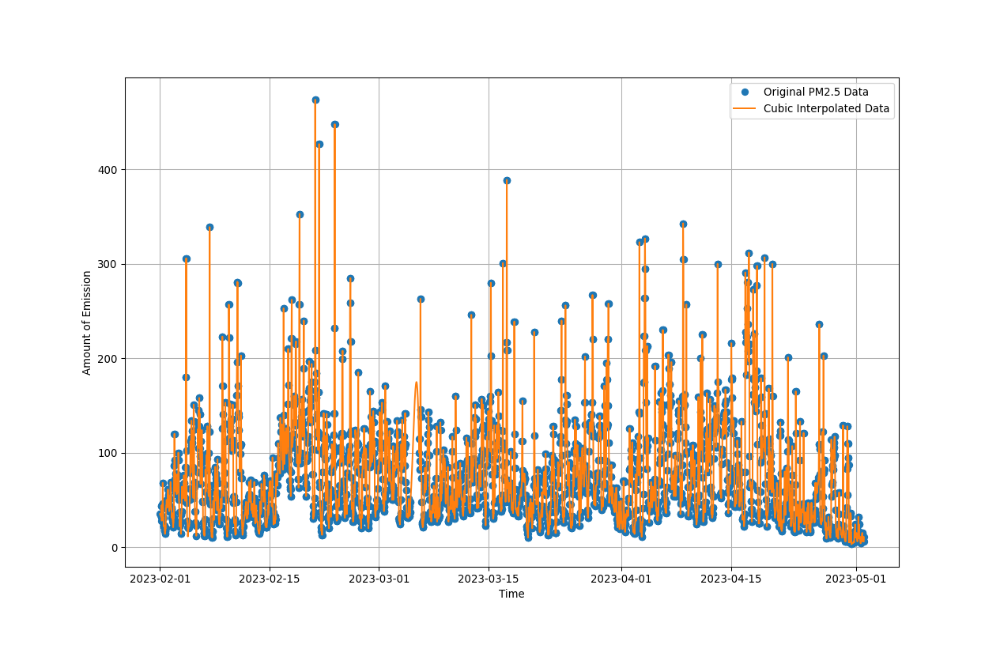

In [24]:
%matplotlib notebook
plt.plot(df.index, df['PM2.5 (µg/m3)'], 'o', label='Original PM2.5 Data')
plt.plot(df.index , new_df_PM25, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [29]:
#cubic spline interpolation
spline_PM25 = df['PM2.5 (µg/m3)'].interpolate(method = "spline", order = 3)
spline_PM25

From
2023-02-01 00:00:00    35.0
2023-02-01 00:15:00    35.0
2023-02-01 00:30:00    35.0
2023-02-01 00:45:00    34.0
2023-02-01 01:00:00    34.0
                       ... 
2023-05-01 22:45:00    11.0
2023-05-01 23:00:00    11.0
2023-05-01 23:15:00    11.0
2023-05-01 23:30:00    11.0
2023-05-01 23:45:00     6.0
Name: PM2.5 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


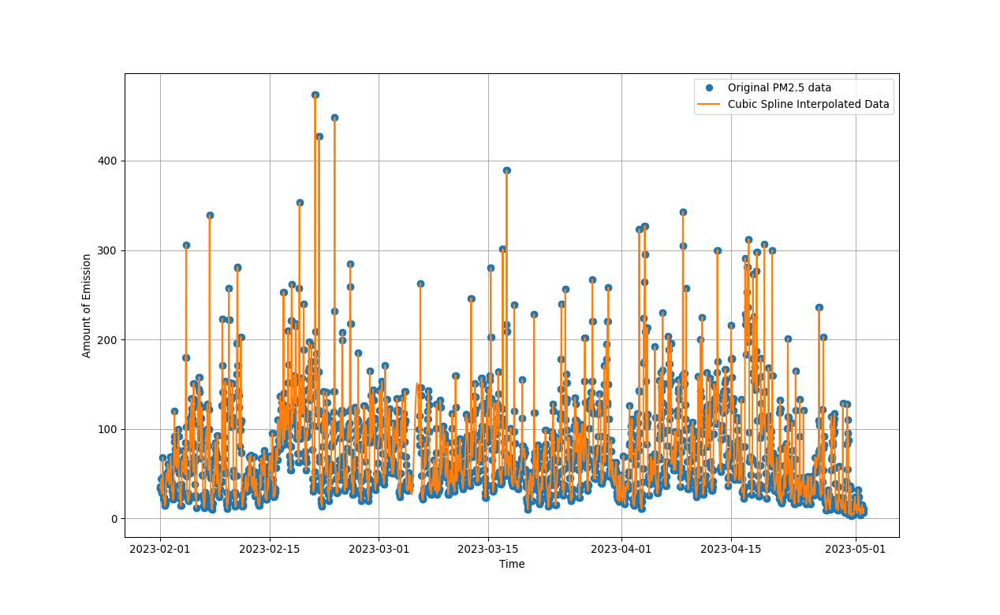

In [26]:
%matplotlib notebook
plt.plot(df.index, df['PM2.5 (µg/m3)'], 'o', label='Original PM2.5 data')
plt.plot(df.index, spline_PM25, label='Cubic Spline Interpolated Data')
# plt.plot(time, new_df_PM10, label='Interpolated1')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


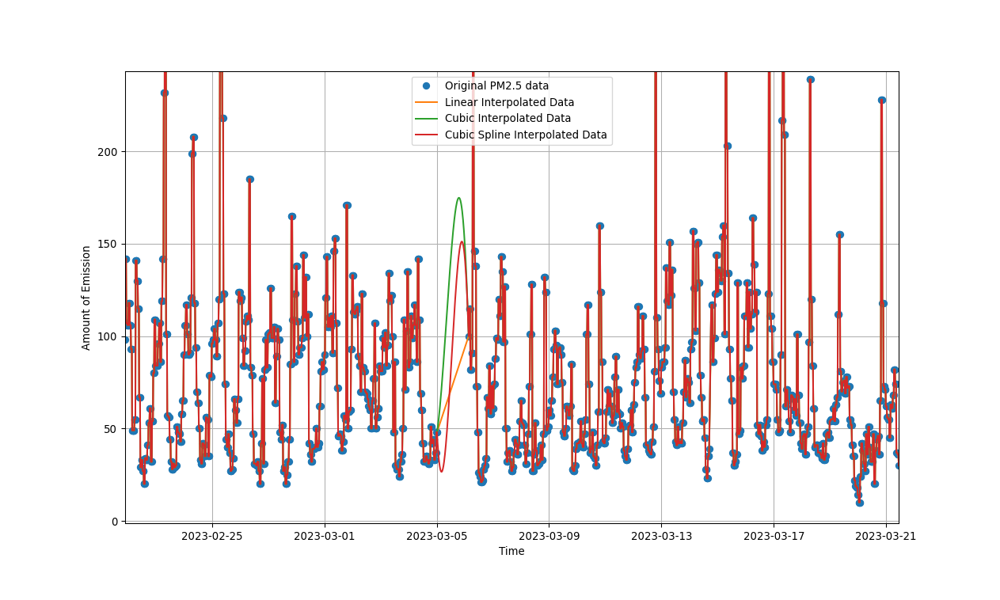

In [27]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['PM2.5 (µg/m3)'], 'o', label='Original PM2.5 data')
plt.plot(df.index , new_df_PM25_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_PM25, label='Cubic Interpolated Data')
plt.plot(df.index, spline_PM25, label='Cubic Spline Interpolated Data')
# plt.plot(time, new_df_PM10, label='Interpolated1')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Cubic Interpolation is the best for PM2.5 as it best follows the pattern of the actual PM2.5 data present.

## Interpolation of NO

In [30]:
#linear interpolation
new_df_NO_l = df['NO (µg/m3)'].interpolate(method="linear")
new_df_NO_l = new_df_NO_l.fillna(method='bfill')
new_df_NO_l

From
2023-02-01 00:00:00    18.1
2023-02-01 00:15:00    18.1
2023-02-01 00:30:00    18.1
2023-02-01 00:45:00    18.1
2023-02-01 01:00:00    18.1
                       ... 
2023-05-01 22:45:00    17.9
2023-05-01 23:00:00    17.9
2023-05-01 23:15:00    19.6
2023-05-01 23:30:00    20.8
2023-05-01 23:45:00    21.8
Name: NO (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


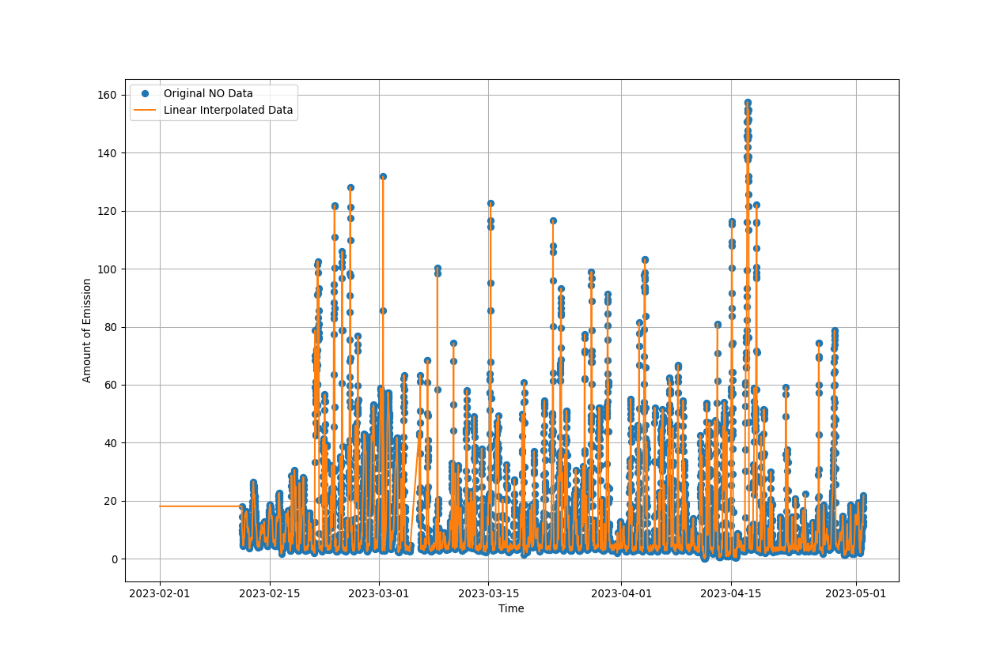

In [29]:
%matplotlib notebook
plt.plot(df.index, df['NO (µg/m3)'], 'o', label='Original NO Data')
plt.plot(df.index , new_df_NO_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [31]:
#cubic interpolation
new_df_NO = df['NO (µg/m3)'].interpolate(method="cubic")
new_df_NO

From
2023-02-01 00:00:00     NaN
2023-02-01 00:15:00     NaN
2023-02-01 00:30:00     NaN
2023-02-01 00:45:00     NaN
2023-02-01 01:00:00     NaN
                       ... 
2023-05-01 22:45:00    17.9
2023-05-01 23:00:00    17.9
2023-05-01 23:15:00    19.6
2023-05-01 23:30:00    20.8
2023-05-01 23:45:00    21.8
Name: NO (µg/m3), Length: 8640, dtype: float64

In [31]:
new_df_NO.isnull().sum()

1004

In [32]:
#initial values nan so we will use backward fill as nan values appear in a cluster in the starting of the data frame
#this will also preserve the sequential structure of the dataset.

In [33]:
new_df_NO = new_df_NO.fillna(method='bfill')
new_df_NO

From
2023-02-01 00:00:00    18.1
2023-02-01 00:15:00    18.1
2023-02-01 00:30:00    18.1
2023-02-01 00:45:00    18.1
2023-02-01 01:00:00    18.1
                       ... 
2023-05-01 22:45:00    17.9
2023-05-01 23:00:00    17.9
2023-05-01 23:15:00    19.6
2023-05-01 23:30:00    20.8
2023-05-01 23:45:00    21.8
Name: NO (µg/m3), Length: 8640, dtype: float64

In [34]:
new_df_NO.isnull().sum()

0

<IPython.core.display.Javascript object>


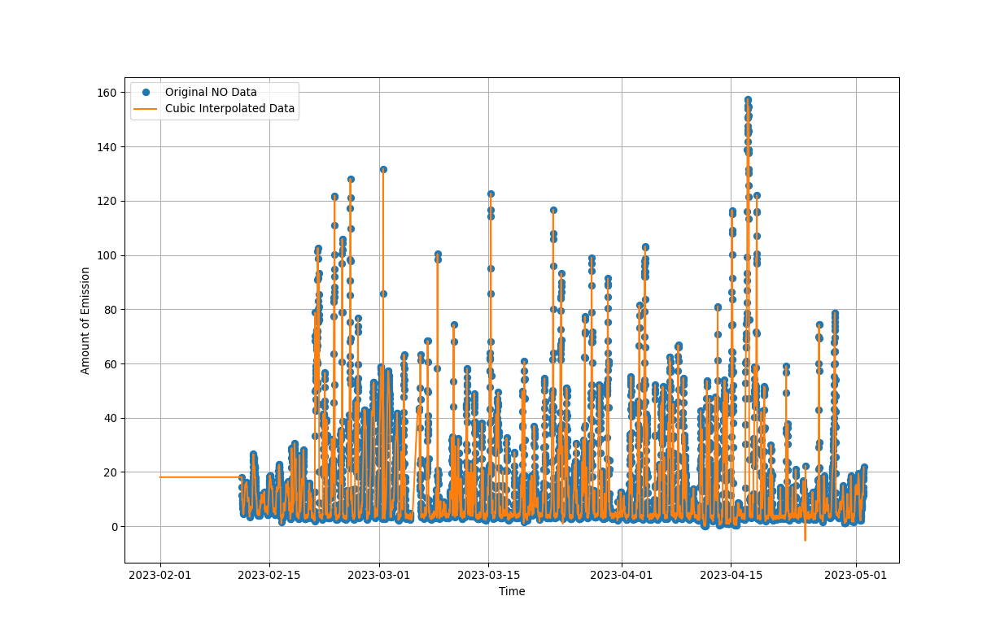

In [35]:
%matplotlib notebook
plt.plot(df.index, df['NO (µg/m3)'], 'o', label='Original NO Data')
plt.plot(df.index , new_df_NO, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [32]:
#cubic spline interpolation
spline_NO = df['NO (µg/m3)'].interpolate(method = "spline", order = 3)
spline_NO = spline_NO.fillna(method='bfill')
spline_NO

From
2023-02-01 00:00:00    18.1
2023-02-01 00:15:00    18.1
2023-02-01 00:30:00    18.1
2023-02-01 00:45:00    18.1
2023-02-01 01:00:00    18.1
                       ... 
2023-05-01 22:45:00    17.9
2023-05-01 23:00:00    17.9
2023-05-01 23:15:00    19.6
2023-05-01 23:30:00    20.8
2023-05-01 23:45:00    21.8
Name: NO (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


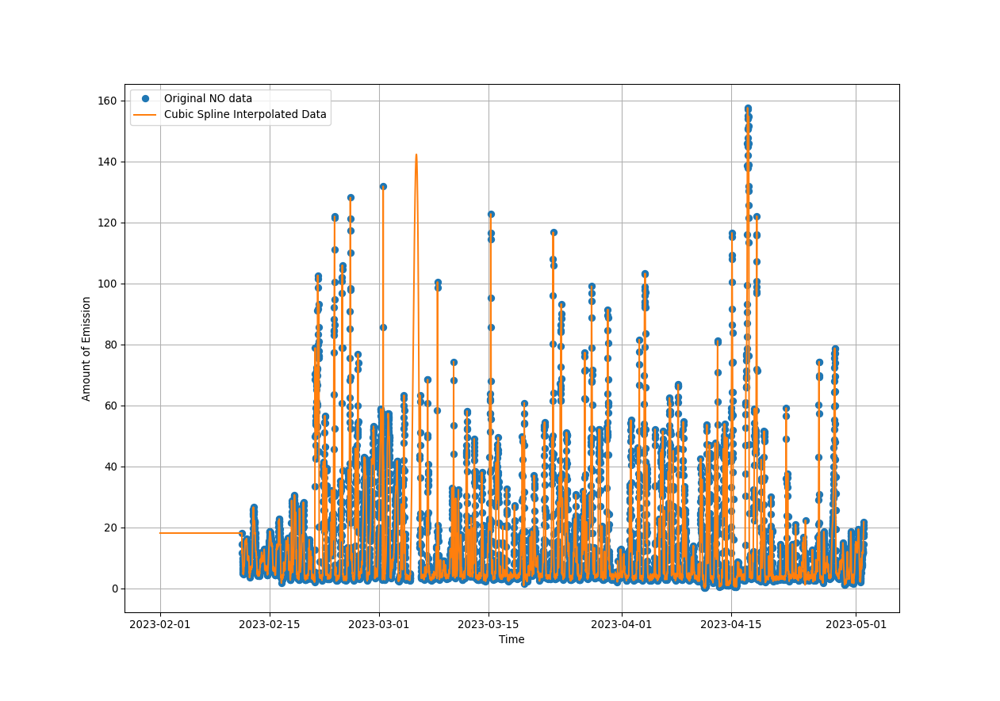

In [37]:
%matplotlib notebook
plt.plot(df.index, df['NO (µg/m3)'], 'o', label='Original NO data')
plt.plot(df.index, spline_NO, label='Cubic Spline Interpolated Data')
# plt.plot(time, new_df_PM10, label='Interpolated1')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


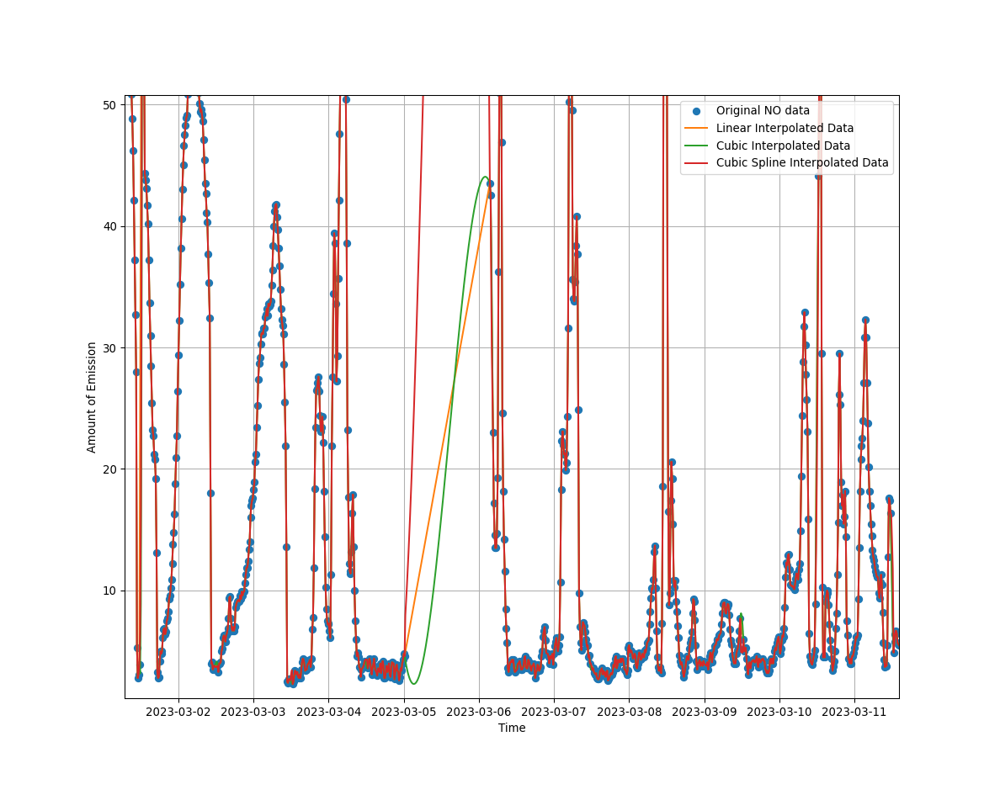

In [38]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['NO (µg/m3)'], 'o', label='Original NO data')
plt.plot(df.index , new_df_NO_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_NO, label='Cubic Interpolated Data')
plt.plot(df.index, spline_NO, label='Cubic Spline Interpolated Data')
# plt.plot(time, new_df_PM10, label='Interpolated1')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Linear Interpolation is the best for NO as cubic gives negative values at few points which is not possible and cubic spline gives abruptly high values at few points.

## Interpolation of NO2

In [33]:
#linear interpolation
new_df_NO2_l = df['NO2 (µg/m3)'].interpolate(method="linear")
new_df_NO2_l

From
2023-02-01 00:00:00     90.1
2023-02-01 00:15:00     88.0
2023-02-01 00:30:00     87.7
2023-02-01 00:45:00     88.9
2023-02-01 01:00:00     90.0
                       ...  
2023-05-01 22:45:00    100.0
2023-05-01 23:00:00    100.0
2023-05-01 23:15:00    100.2
2023-05-01 23:30:00    100.2
2023-05-01 23:45:00     98.8
Name: NO2 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


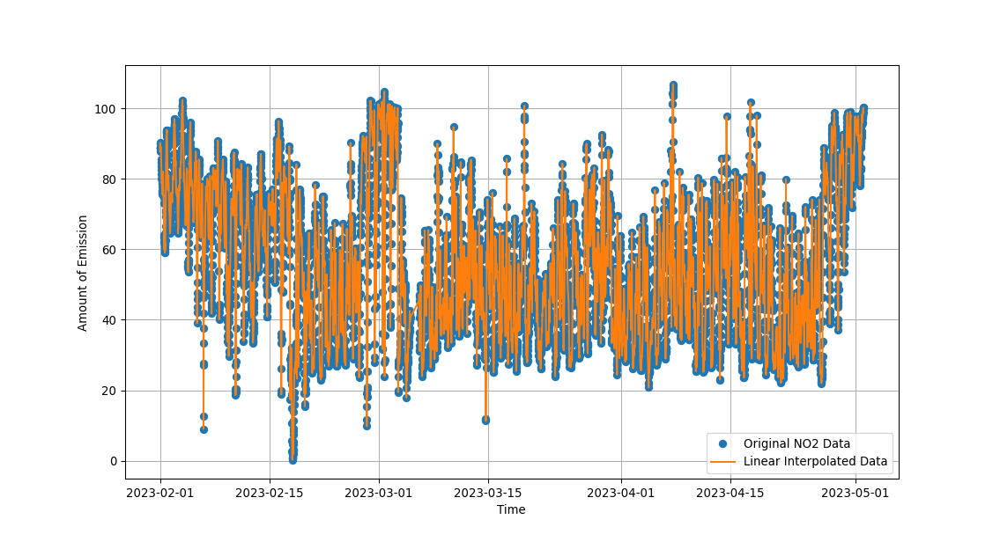

In [31]:
%matplotlib notebook
plt.plot(df.index, df['NO2 (µg/m3)'], 'o', label='Original NO2 Data')
plt.plot(df.index , new_df_NO2_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [34]:
#cubic interpolation
new_df_NO2 = df['NO2 (µg/m3)'].interpolate(method="cubic")
new_df_NO2

From
2023-02-01 00:00:00     90.1
2023-02-01 00:15:00     88.0
2023-02-01 00:30:00     87.7
2023-02-01 00:45:00     88.9
2023-02-01 01:00:00     90.0
                       ...  
2023-05-01 22:45:00    100.0
2023-05-01 23:00:00    100.0
2023-05-01 23:15:00    100.2
2023-05-01 23:30:00    100.2
2023-05-01 23:45:00     98.8
Name: NO2 (µg/m3), Length: 8640, dtype: float64

In [33]:
new_df_NO2.isnull().sum()

0

<IPython.core.display.Javascript object>


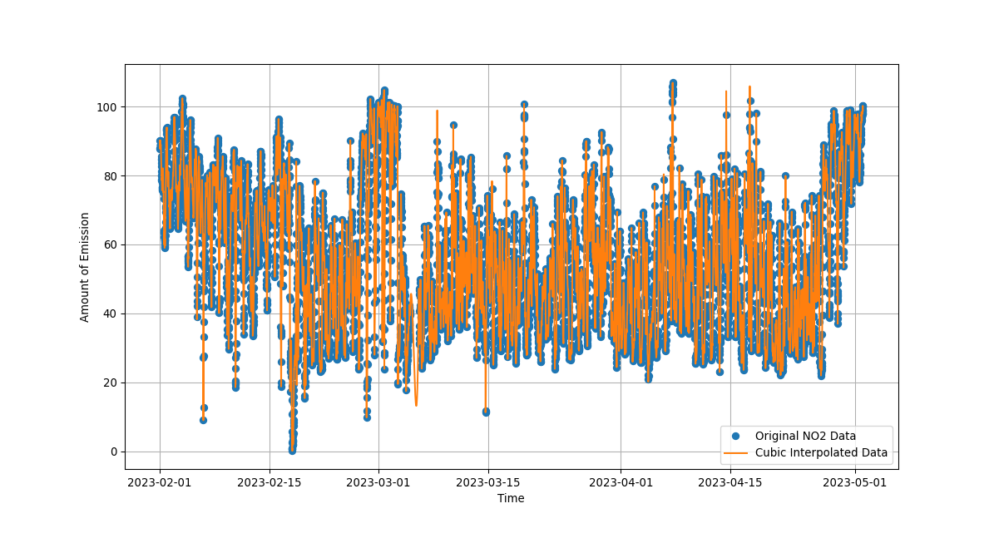

In [34]:
%matplotlib notebook
plt.plot(df.index, df['NO2 (µg/m3)'], 'o', label='Original NO2 Data')
plt.plot(df.index , new_df_NO2, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [35]:
#cubic spline interpolation
spline_NO2 = df['NO2 (µg/m3)'].interpolate(method = "spline", order = 3)
spline_NO2

From
2023-02-01 00:00:00     90.1
2023-02-01 00:15:00     88.0
2023-02-01 00:30:00     87.7
2023-02-01 00:45:00     88.9
2023-02-01 01:00:00     90.0
                       ...  
2023-05-01 22:45:00    100.0
2023-05-01 23:00:00    100.0
2023-05-01 23:15:00    100.2
2023-05-01 23:30:00    100.2
2023-05-01 23:45:00     98.8
Name: NO2 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


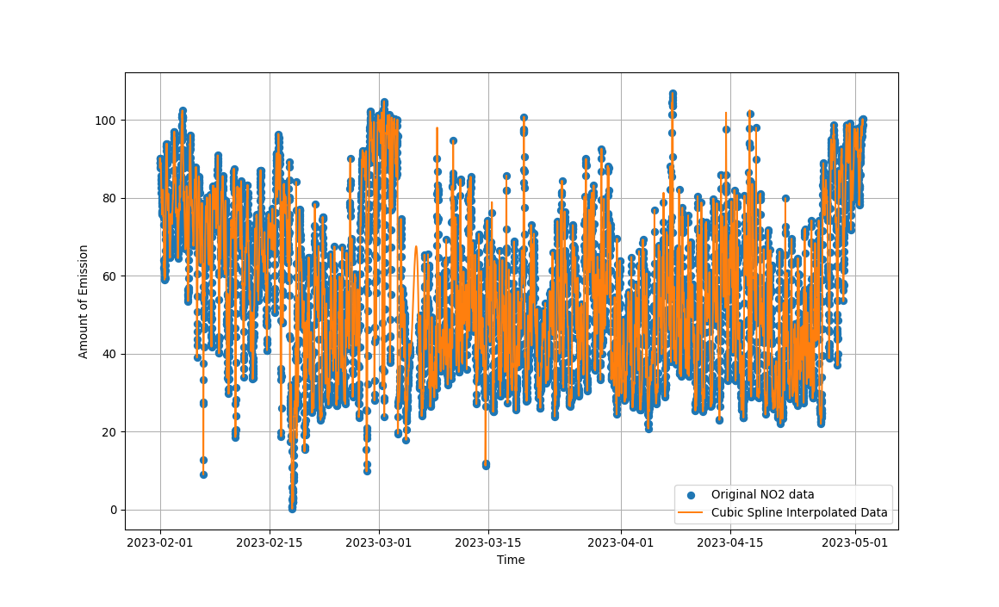

In [36]:
%matplotlib notebook
plt.plot(df.index, df['NO2 (µg/m3)'], 'o', label='Original NO2 data')
plt.plot(df.index, spline_NO2, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


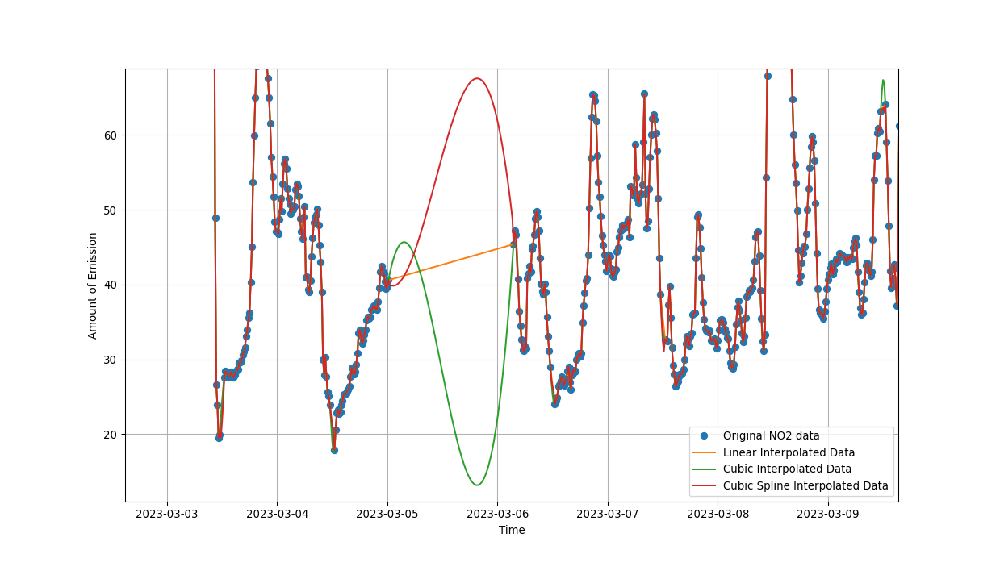

In [37]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['NO2 (µg/m3)'], 'o', label='Original NO2 data')
plt.plot(df.index , new_df_NO2_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_NO2, label='Cubic Interpolated Data')
plt.plot(df.index, spline_NO2, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Cubic spline Interpolation is the best for NO2 as it best follows the pattern of the actual data present.

## Interpolation of NOX

In [36]:
#linear interpolation
new_df_NOX_l = df['NOX (ppb)'].interpolate(method="linear")
new_df_NOX_l

From
2023-02-01 00:00:00    56.2
2023-02-01 00:15:00    55.1
2023-02-01 00:30:00    55.2
2023-02-01 00:45:00    55.7
2023-02-01 01:00:00    55.8
                       ... 
2023-05-01 22:45:00    67.8
2023-05-01 23:00:00    67.7
2023-05-01 23:15:00    69.2
2023-05-01 23:30:00    70.2
2023-05-01 23:45:00    70.3
Name: NOX (ppb), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


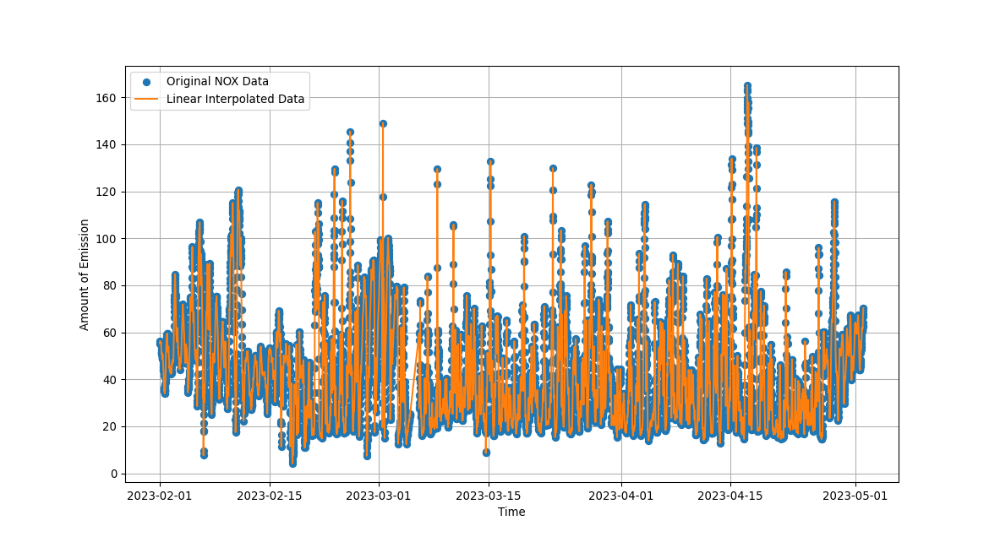

In [15]:
%matplotlib notebook
plt.plot(df.index, df['NOX (ppb)'], 'o', label='Original NOX Data')
plt.plot(df.index , new_df_NOX_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [37]:
#cubic interpolation
new_df_NOX = df['NOX (ppb)'].interpolate(method="cubic")
new_df_NOX

From
2023-02-01 00:00:00    56.2
2023-02-01 00:15:00    55.1
2023-02-01 00:30:00    55.2
2023-02-01 00:45:00    55.7
2023-02-01 01:00:00    55.8
                       ... 
2023-05-01 22:45:00    67.8
2023-05-01 23:00:00    67.7
2023-05-01 23:15:00    69.2
2023-05-01 23:30:00    70.2
2023-05-01 23:45:00    70.3
Name: NOX (ppb), Length: 8640, dtype: float64

In [17]:
new_df_NOX.isnull().sum()

0

<IPython.core.display.Javascript object>


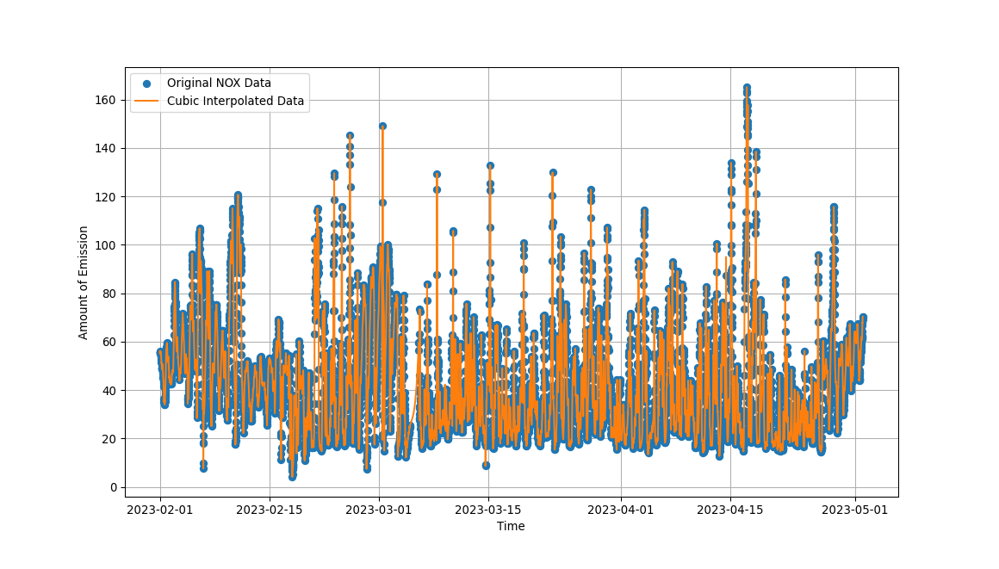

In [18]:
%matplotlib notebook
plt.plot(df.index, df['NOX (ppb)'], 'o', label='Original NOX Data')
plt.plot(df.index , new_df_NOX, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [38]:
#cubic spline interpolation
spline_NOX = df['NOX (ppb)'].interpolate(method = "spline", order = 3)
spline_NOX

From
2023-02-01 00:00:00    56.2
2023-02-01 00:15:00    55.1
2023-02-01 00:30:00    55.2
2023-02-01 00:45:00    55.7
2023-02-01 01:00:00    55.8
                       ... 
2023-05-01 22:45:00    67.8
2023-05-01 23:00:00    67.7
2023-05-01 23:15:00    69.2
2023-05-01 23:30:00    70.2
2023-05-01 23:45:00    70.3
Name: NOX (ppb), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


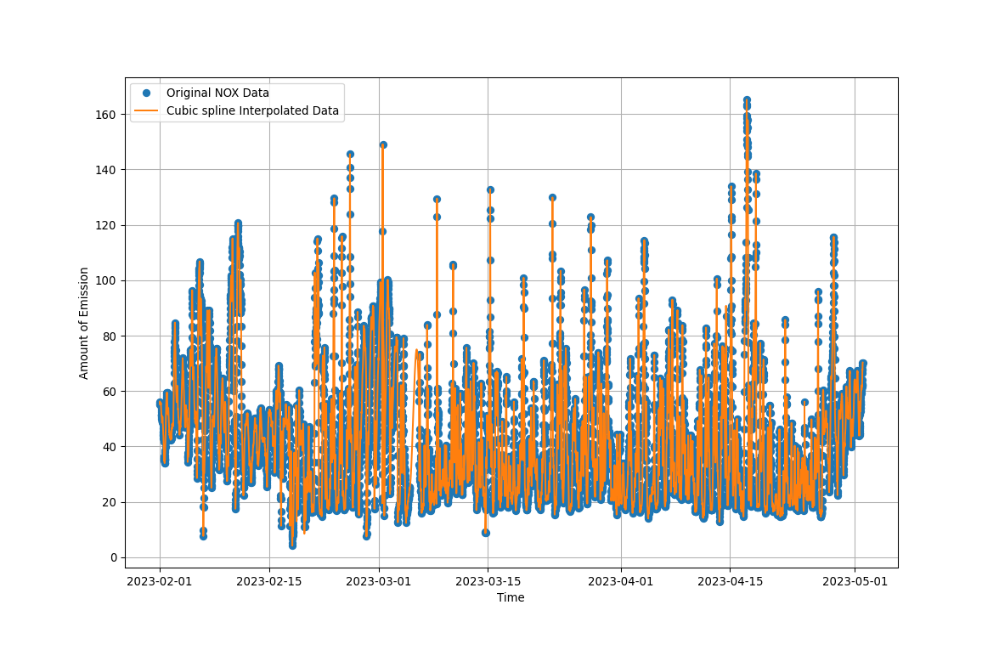

In [40]:
%matplotlib notebook
plt.plot(df.index, df['NOX (ppb)'], 'o', label='Original NOX Data')
plt.plot(df.index , spline_NOX, label='Cubic spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


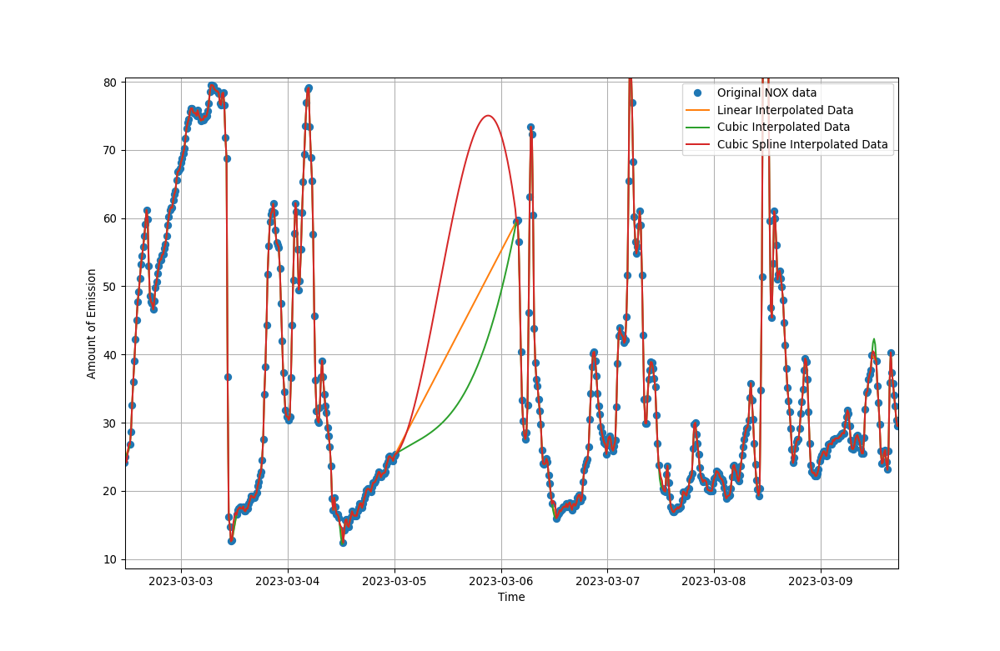

In [41]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['NOX (ppb)'], 'o', label='Original NOX data')
plt.plot(df.index , new_df_NOX_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_NOX, label='Cubic Interpolated Data')
plt.plot(df.index, spline_NOX, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Cubic spline Interpolation is the best for NOX as it best follows the pattern of the actual data present.

## Interpolation of CO

In [39]:
#linear interpolation
new_df_CO_l = df['CO (mg/m3)'].interpolate(method="linear")
new_df_CO_l

From
2023-02-01 00:00:00    0.31
2023-02-01 00:15:00    0.33
2023-02-01 00:30:00    0.38
2023-02-01 00:45:00    0.38
2023-02-01 01:00:00    0.38
                       ... 
2023-05-01 22:45:00    0.63
2023-05-01 23:00:00    0.57
2023-05-01 23:15:00    0.58
2023-05-01 23:30:00    0.58
2023-05-01 23:45:00    0.58
Name: CO (mg/m3), Length: 8640, dtype: float64

In [11]:
new_df_CO_l.isnull().sum()

0

<IPython.core.display.Javascript object>


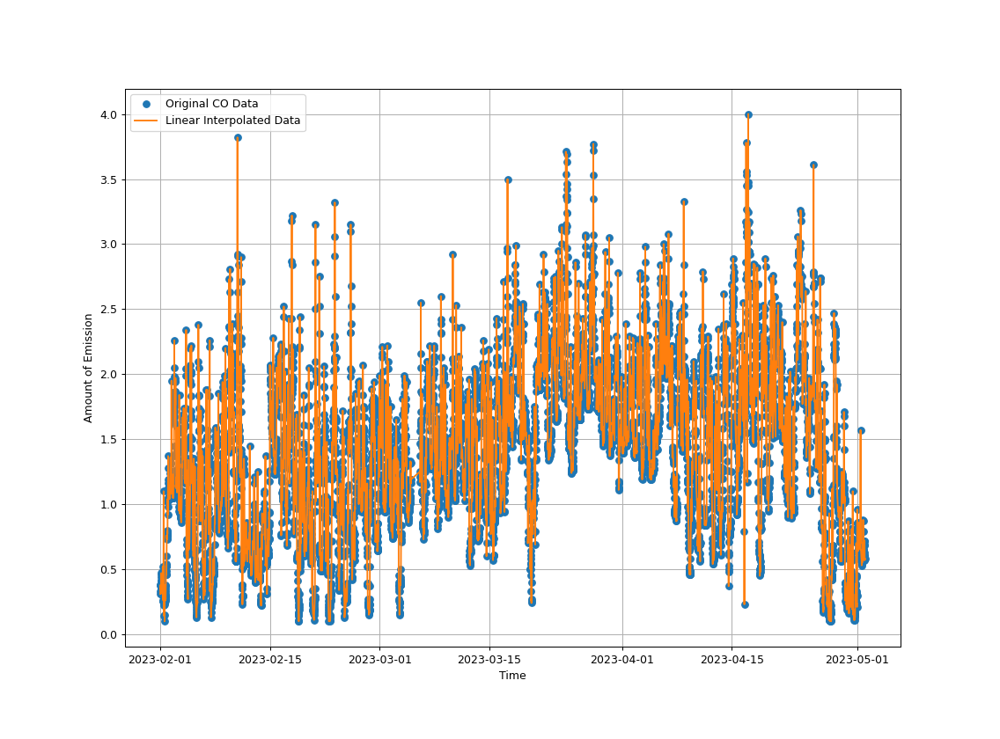

In [12]:
%matplotlib notebook
plt.plot(df.index, df['CO (mg/m3)'], 'o', label='Original CO Data')
plt.plot(df.index , new_df_CO_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [13]:
#cubic interpolation
new_df_CO = df['CO (mg/m3)'].interpolate(method="cubic")
new_df_CO

From
2023-02-01 00:00:00    0.31
2023-02-01 00:15:00    0.33
2023-02-01 00:30:00    0.38
2023-02-01 00:45:00    0.38
2023-02-01 01:00:00    0.38
                       ... 
2023-05-01 22:45:00    0.63
2023-05-01 23:00:00    0.57
2023-05-01 23:15:00    0.58
2023-05-01 23:30:00    0.58
2023-05-01 23:45:00     NaN
Name: CO (mg/m3), Length: 8640, dtype: float64

In [14]:
new_df_CO.isnull().sum()

1

In [15]:
new_df_CO = new_df_CO.fillna(method='ffill')
new_df_CO

From
2023-02-01 00:00:00    0.31
2023-02-01 00:15:00    0.33
2023-02-01 00:30:00    0.38
2023-02-01 00:45:00    0.38
2023-02-01 01:00:00    0.38
                       ... 
2023-05-01 22:45:00    0.63
2023-05-01 23:00:00    0.57
2023-05-01 23:15:00    0.58
2023-05-01 23:30:00    0.58
2023-05-01 23:45:00    0.58
Name: CO (mg/m3), Length: 8640, dtype: float64

In [16]:
new_df_CO.isnull().sum()

0

<IPython.core.display.Javascript object>


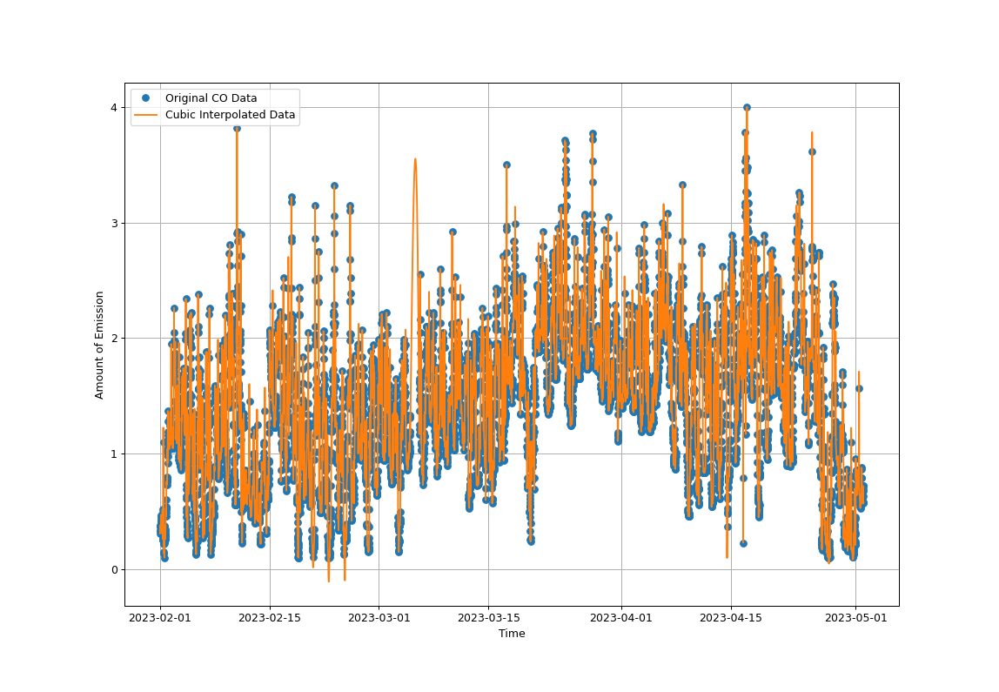

In [19]:
%matplotlib notebook
plt.plot(df.index, df['CO (mg/m3)'], 'o', label='Original CO Data')
plt.plot(df.index , new_df_CO, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [22]:
#cubic spline interpolation
spline_CO = df['CO (mg/m3)'].interpolate(method = "spline", order = 3)
spline_CO

From
2023-02-01 00:00:00    0.310000
2023-02-01 00:15:00    0.330000
2023-02-01 00:30:00    0.380000
2023-02-01 00:45:00    0.380000
2023-02-01 01:00:00    0.380000
                         ...   
2023-05-01 22:45:00    0.630000
2023-05-01 23:00:00    0.570000
2023-05-01 23:15:00    0.580000
2023-05-01 23:30:00    0.580000
2023-05-01 23:45:00    0.828505
Name: CO (mg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


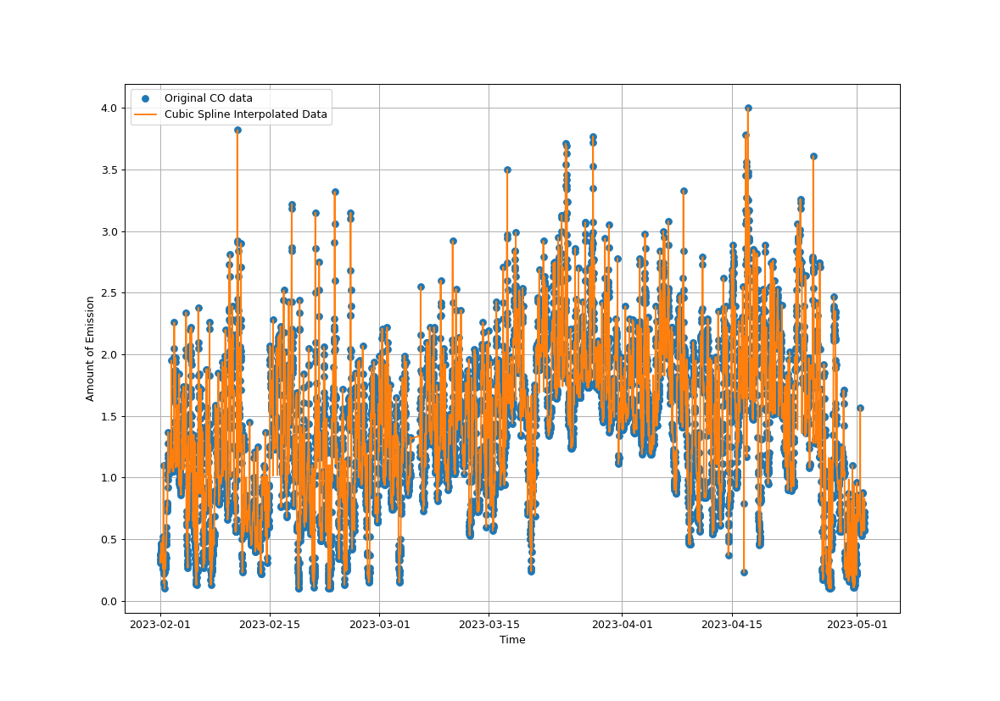

In [23]:
%matplotlib notebook
plt.plot(df.index, df['CO (mg/m3)'], 'o', label='Original CO data')
plt.plot(df.index, spline_CO, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


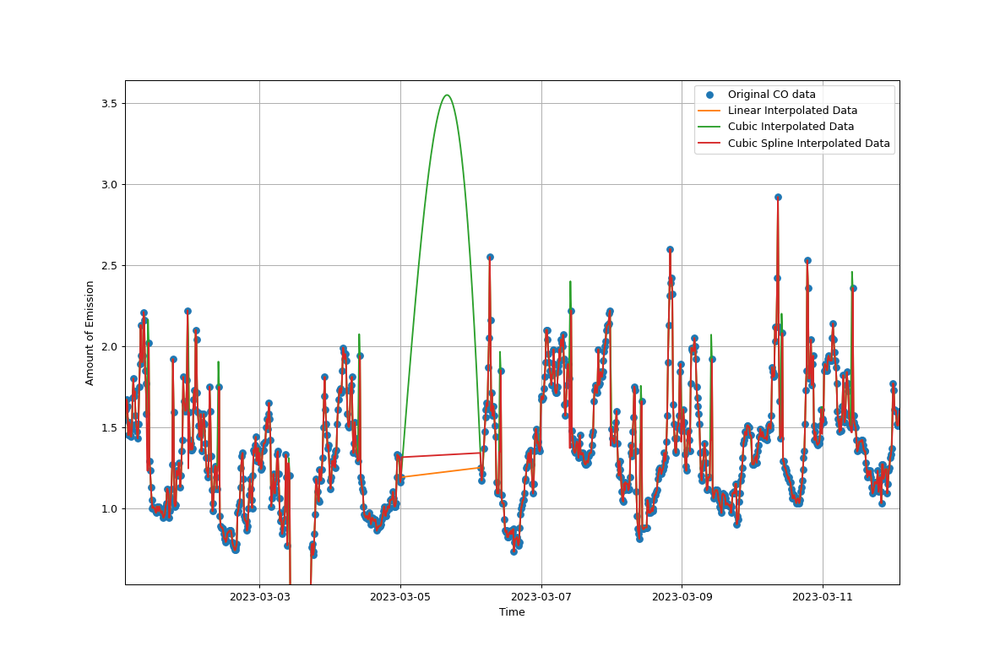

In [24]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['CO (mg/m3)'], 'o', label='Original CO data')
plt.plot(df.index , new_df_CO_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_CO, label='Cubic Interpolated Data')
plt.plot(df.index, spline_CO, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Cubic spline Interpolation is the best for CO as it best follows the trend of the actual data present.(increases after decreasing)

## Interpolation of SO2

In [40]:
#linear interpolation
new_df_SO2_l = df['SO2 (µg/m3)'].interpolate(method="linear")
new_df_SO2_l = new_df_SO2_l.fillna(method='bfill')
new_df_SO2_l

From
2023-02-01 00:00:00     8.2
2023-02-01 00:15:00     8.2
2023-02-01 00:30:00     8.2
2023-02-01 00:45:00     8.2
2023-02-01 01:00:00     8.2
                       ... 
2023-05-01 22:45:00    10.0
2023-05-01 23:00:00    10.0
2023-05-01 23:15:00     9.9
2023-05-01 23:30:00     9.5
2023-05-01 23:45:00     9.5
Name: SO2 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


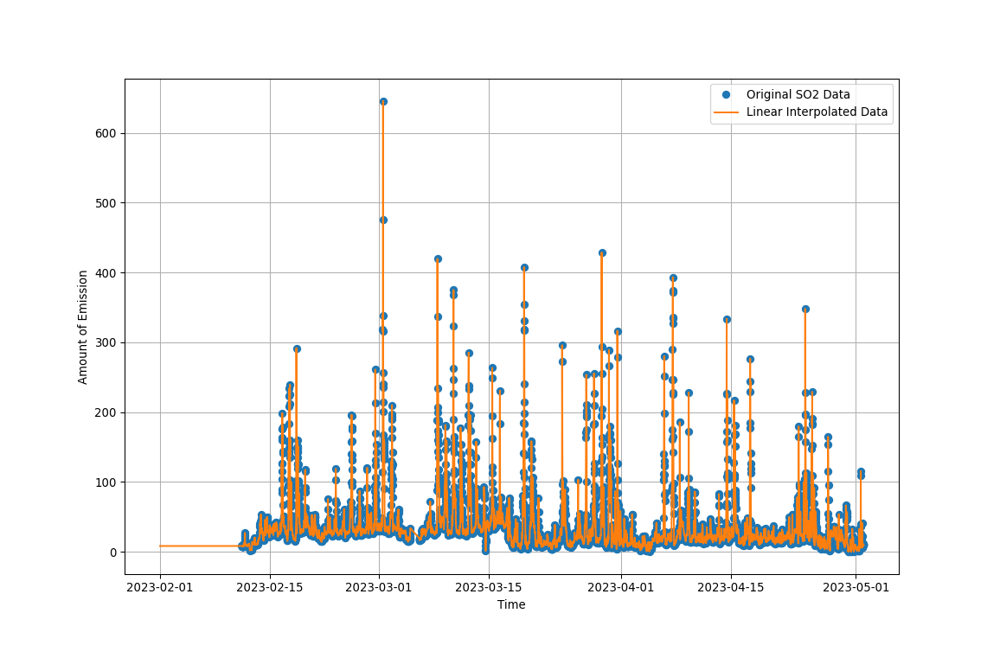

In [54]:
%matplotlib notebook
plt.plot(df.index, df['SO2 (µg/m3)'], 'o', label='Original SO2 Data')
plt.plot(df.index , new_df_SO2_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [41]:
#cubic interpolation
new_df_SO2 = df['SO2 (µg/m3)'].interpolate(method="cubic")
new_df_SO2

From
2023-02-01 00:00:00     NaN
2023-02-01 00:15:00     NaN
2023-02-01 00:30:00     NaN
2023-02-01 00:45:00     NaN
2023-02-01 01:00:00     NaN
                       ... 
2023-05-01 22:45:00    10.0
2023-05-01 23:00:00    10.0
2023-05-01 23:15:00     9.9
2023-05-01 23:30:00     9.5
2023-05-01 23:45:00     NaN
Name: SO2 (µg/m3), Length: 8640, dtype: float64

In [56]:
new_df_SO2.isnull().sum()

1005

In [57]:
new_df_SO2 = new_df_SO2.fillna(method='bfill')
new_df_SO2 = new_df_SO2.fillna(method='ffill')
new_df_SO2

From
2023-02-01 00:00:00     8.2
2023-02-01 00:15:00     8.2
2023-02-01 00:30:00     8.2
2023-02-01 00:45:00     8.2
2023-02-01 01:00:00     8.2
                       ... 
2023-05-01 22:45:00    10.0
2023-05-01 23:00:00    10.0
2023-05-01 23:15:00     9.9
2023-05-01 23:30:00     9.5
2023-05-01 23:45:00     9.5
Name: SO2 (µg/m3), Length: 8640, dtype: float64

In [58]:
new_df_SO2.isnull().sum()

0

<IPython.core.display.Javascript object>


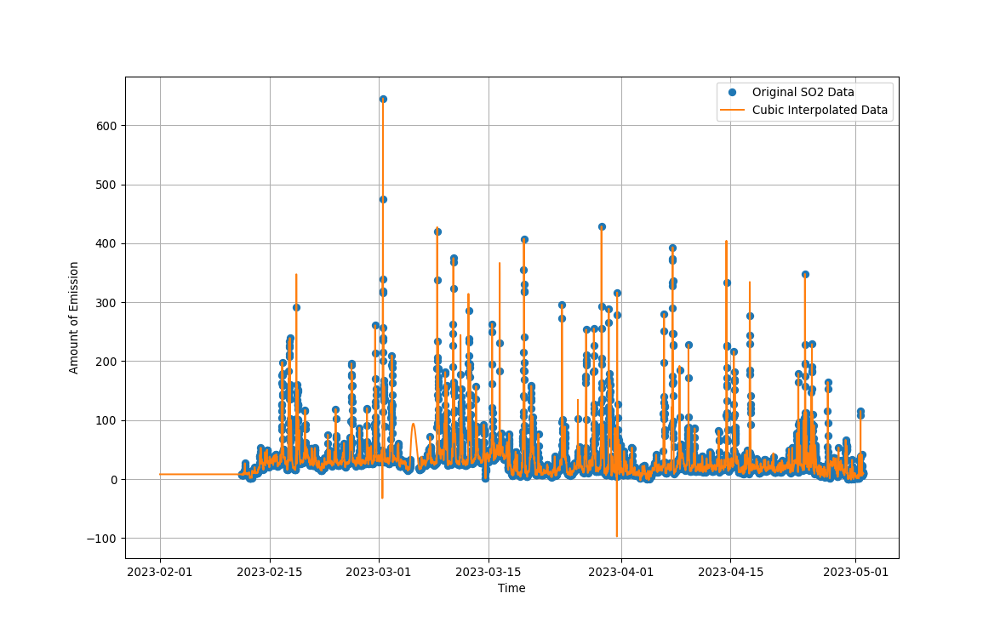

In [59]:
%matplotlib notebook
plt.plot(df.index, df['SO2 (µg/m3)'], 'o', label='Original SO2 Data')
plt.plot(df.index , new_df_SO2, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [42]:
#cubic spline interpolation
spline_SO2 = df['SO2 (µg/m3)'].interpolate(method = "spline", order = 3)
spline_SO2 = spline_SO2.fillna(method='bfill')
spline_SO2

From
2023-02-01 00:00:00     8.200000
2023-02-01 00:15:00     8.200000
2023-02-01 00:30:00     8.200000
2023-02-01 00:45:00     8.200000
2023-02-01 01:00:00     8.200000
                         ...    
2023-05-01 22:45:00    10.000000
2023-05-01 23:00:00    10.000000
2023-05-01 23:15:00     9.900000
2023-05-01 23:30:00     9.500000
2023-05-01 23:45:00     8.403109
Name: SO2 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


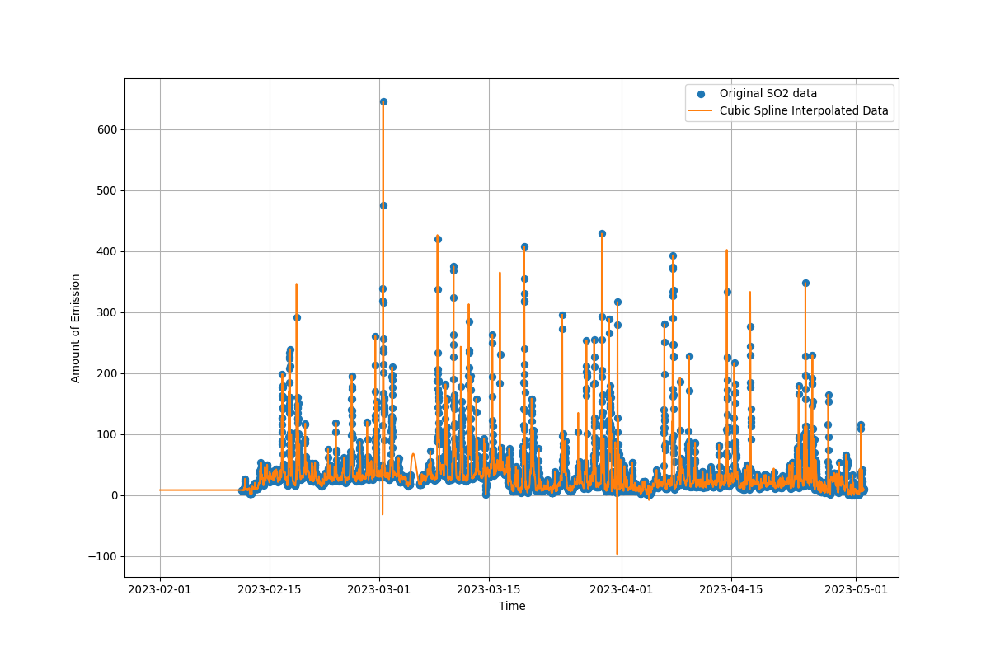

In [61]:
%matplotlib notebook
plt.plot(df.index, df['SO2 (µg/m3)'], 'o', label='Original SO2 data')
plt.plot(df.index, spline_SO2, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


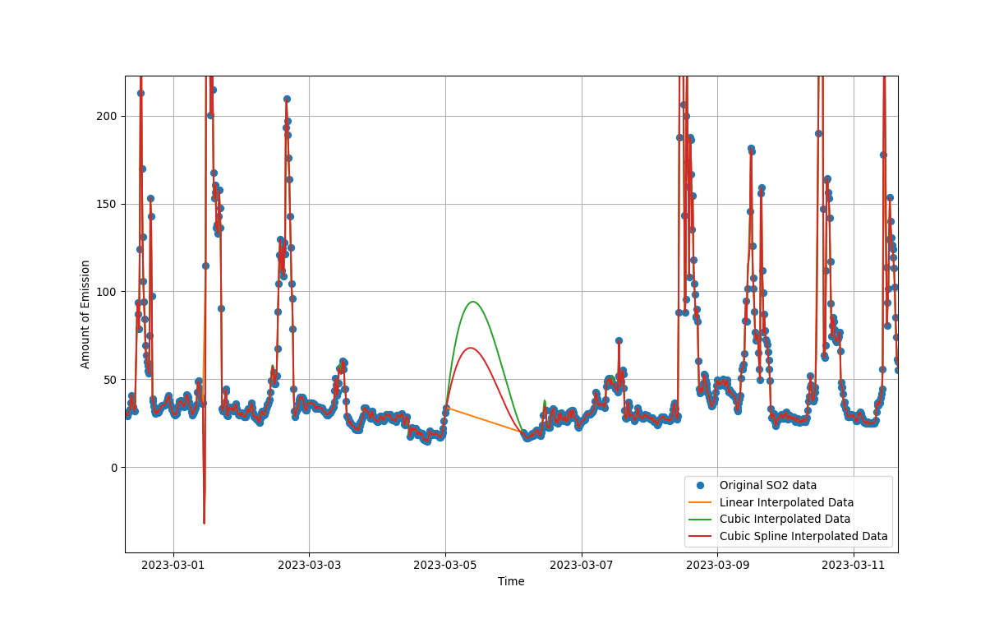

In [62]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['SO2 (µg/m3)'], 'o', label='Original SO2 data')
plt.plot(df.index , new_df_SO2_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_SO2, label='Cubic Interpolated Data')
plt.plot(df.index, spline_SO2, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Linear Interpolation is the best for SO2 as cubic and cubic spline gives negative values of density at a points which is not possible.

## Interpolation of NH3

In [43]:
#linear interpolation
new_df_NH3_l = df['NH3 (µg/m3)'].interpolate(method="linear")
new_df_NH3_l

From
2023-02-01 00:00:00    17.7
2023-02-01 00:15:00    18.3
2023-02-01 00:30:00    19.7
2023-02-01 00:45:00    21.3
2023-02-01 01:00:00    22.3
                       ... 
2023-05-01 22:45:00    10.7
2023-05-01 23:00:00    10.4
2023-05-01 23:15:00    10.5
2023-05-01 23:30:00    10.8
2023-05-01 23:45:00    11.0
Name: NH3 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


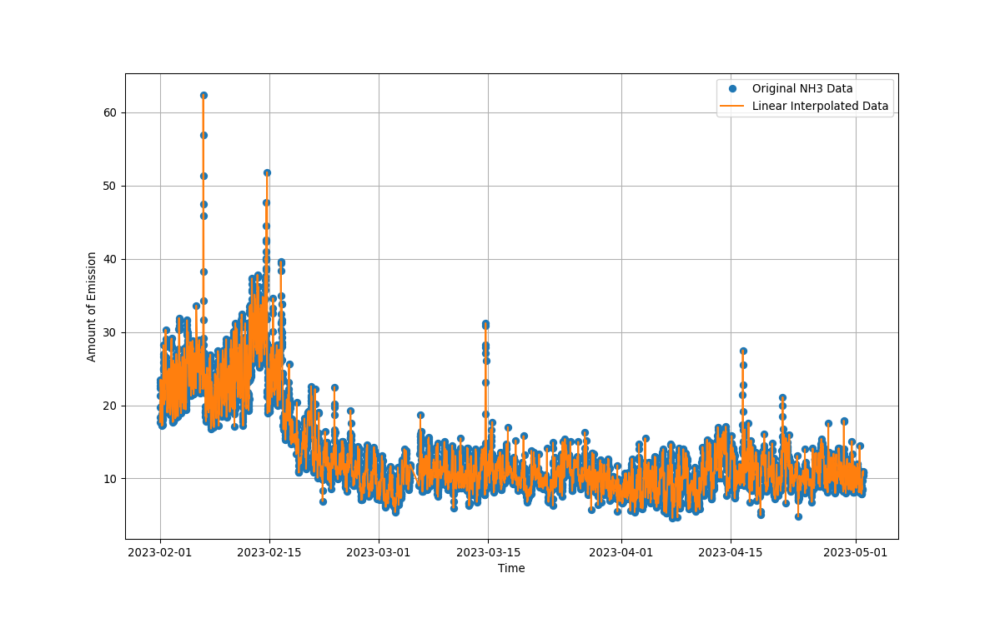

In [64]:
%matplotlib notebook
plt.plot(df.index, df['NH3 (µg/m3)'], 'o', label='Original NH3 Data')
plt.plot(df.index , new_df_NH3_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [44]:
#cubic interpolation
new_df_NH3 = df['NH3 (µg/m3)'].interpolate(method="cubic")
new_df_NH3

From
2023-02-01 00:00:00    17.7
2023-02-01 00:15:00    18.3
2023-02-01 00:30:00    19.7
2023-02-01 00:45:00    21.3
2023-02-01 01:00:00    22.3
                       ... 
2023-05-01 22:45:00    10.7
2023-05-01 23:00:00    10.4
2023-05-01 23:15:00    10.5
2023-05-01 23:30:00    10.8
2023-05-01 23:45:00    11.0
Name: NH3 (µg/m3), Length: 8640, dtype: float64

In [66]:
new_df_NH3.isnull().sum()

0

<IPython.core.display.Javascript object>


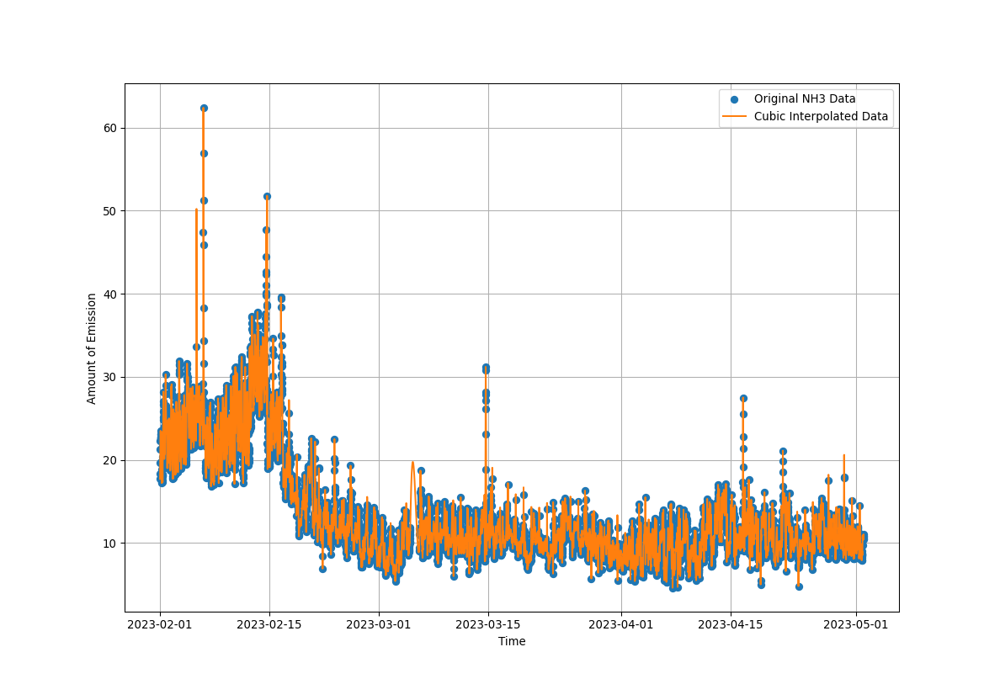

In [67]:
%matplotlib notebook
plt.plot(df.index, df['NH3 (µg/m3)'], 'o', label='Original NH3 Data')
plt.plot(df.index , new_df_NH3, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [45]:
#cubic spline interpolation
spline_NH3 = df['NH3 (µg/m3)'].interpolate(method = "spline", order = 3)
spline_NH3

From
2023-02-01 00:00:00    17.7
2023-02-01 00:15:00    18.3
2023-02-01 00:30:00    19.7
2023-02-01 00:45:00    21.3
2023-02-01 01:00:00    22.3
                       ... 
2023-05-01 22:45:00    10.7
2023-05-01 23:00:00    10.4
2023-05-01 23:15:00    10.5
2023-05-01 23:30:00    10.8
2023-05-01 23:45:00    11.0
Name: NH3 (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


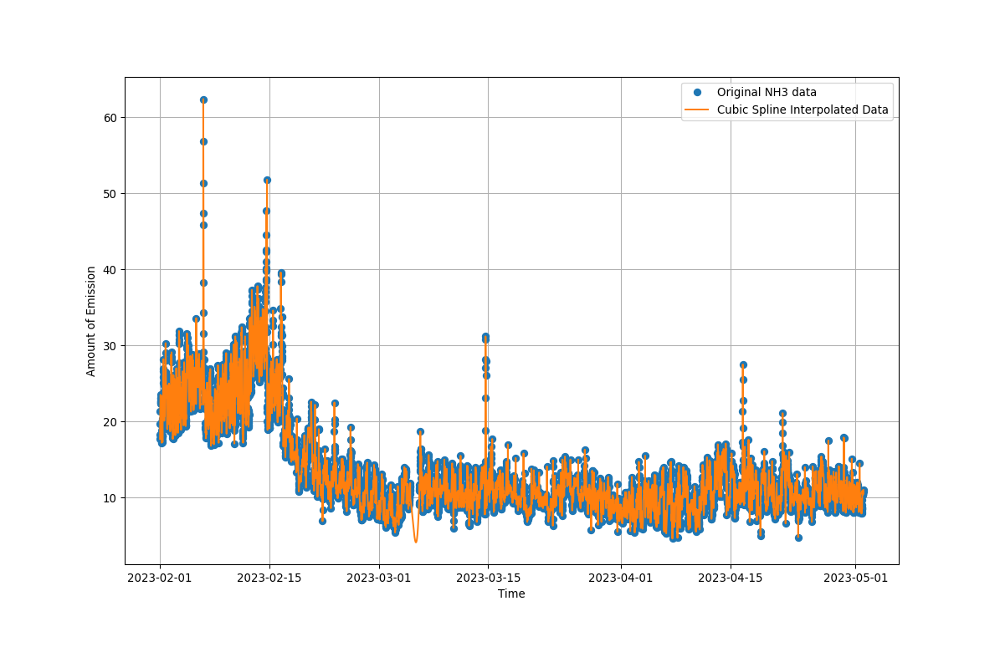

In [69]:
%matplotlib notebook
plt.plot(df.index, df['NH3 (µg/m3)'], 'o', label='Original NH3 data')
plt.plot(df.index, spline_NH3, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


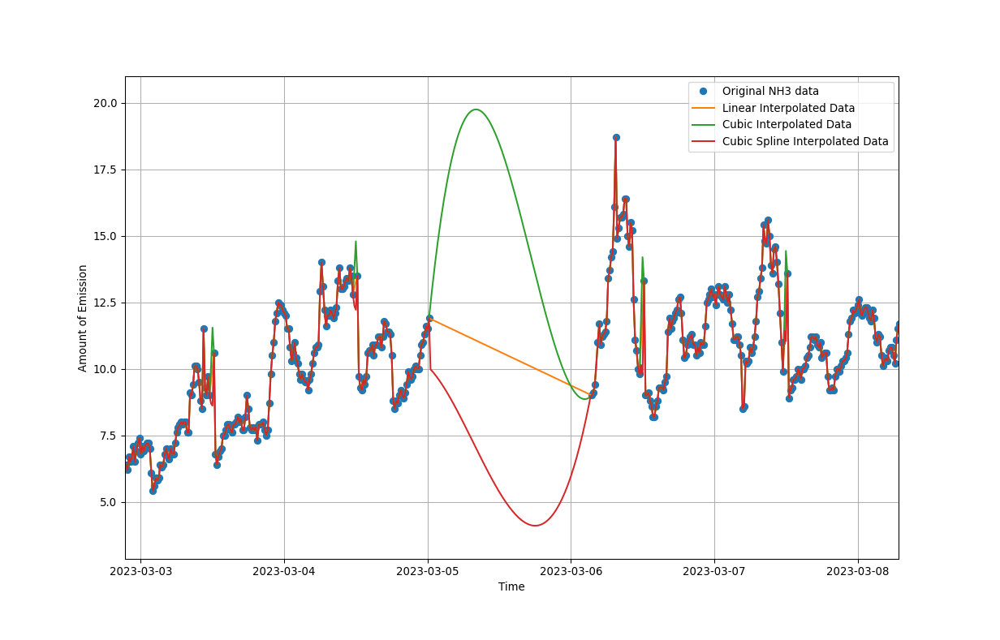

In [70]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['NH3 (µg/m3)'], 'o', label='Original NH3 data')
plt.plot(df.index , new_df_NH3_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_NH3, label='Cubic Interpolated Data')
plt.plot(df.index, spline_NH3, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Linear Interpolation is the best for NH3 as it best follows the trend of the actual data present.

## Interpolation of OZONE

In [46]:
#linear interpolation
new_df_OZONE_l = df['OZONE (µg/m3)'].interpolate(method="linear")
new_df_OZONE_l

From
2023-02-01 00:00:00    28.1
2023-02-01 00:15:00    27.1
2023-02-01 00:30:00    24.9
2023-02-01 00:45:00    21.9
2023-02-01 01:00:00    16.7
                       ... 
2023-05-01 22:45:00    26.1
2023-05-01 23:00:00    30.9
2023-05-01 23:15:00    29.6
2023-05-01 23:30:00    30.0
2023-05-01 23:45:00    33.5
Name: OZONE (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


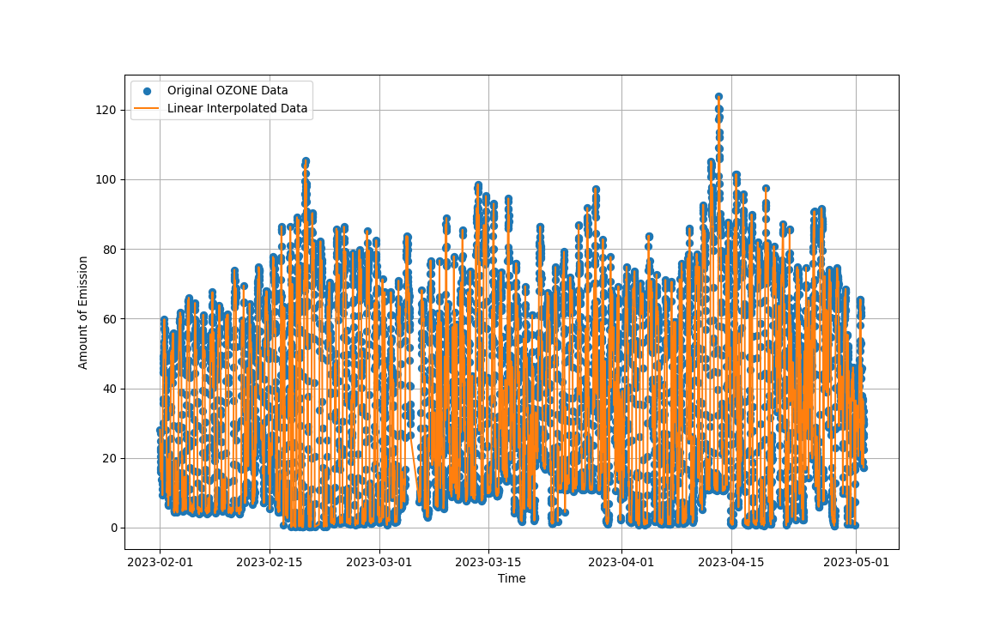

In [72]:
%matplotlib notebook
plt.plot(df.index, df['OZONE (µg/m3)'], 'o', label='Original OZONE Data')
plt.plot(df.index , new_df_OZONE_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [12]:
#cubic interpolation
new_df_OZONE = df['OZONE (µg/m3)'].interpolate(method="cubic")
new_df_OZONE

From
2023-02-01 00:00:00    28.1
2023-02-01 00:15:00    27.1
2023-02-01 00:30:00    24.9
2023-02-01 00:45:00    21.9
2023-02-01 01:00:00    16.7
                       ... 
2023-05-01 22:45:00    26.1
2023-05-01 23:00:00    30.9
2023-05-01 23:15:00    29.6
2023-05-01 23:30:00    30.0
2023-05-01 23:45:00    33.5
Name: OZONE (µg/m3), Length: 8640, dtype: float64

In [75]:
new_df_OZONE.isnull().sum()

0

<IPython.core.display.Javascript object>


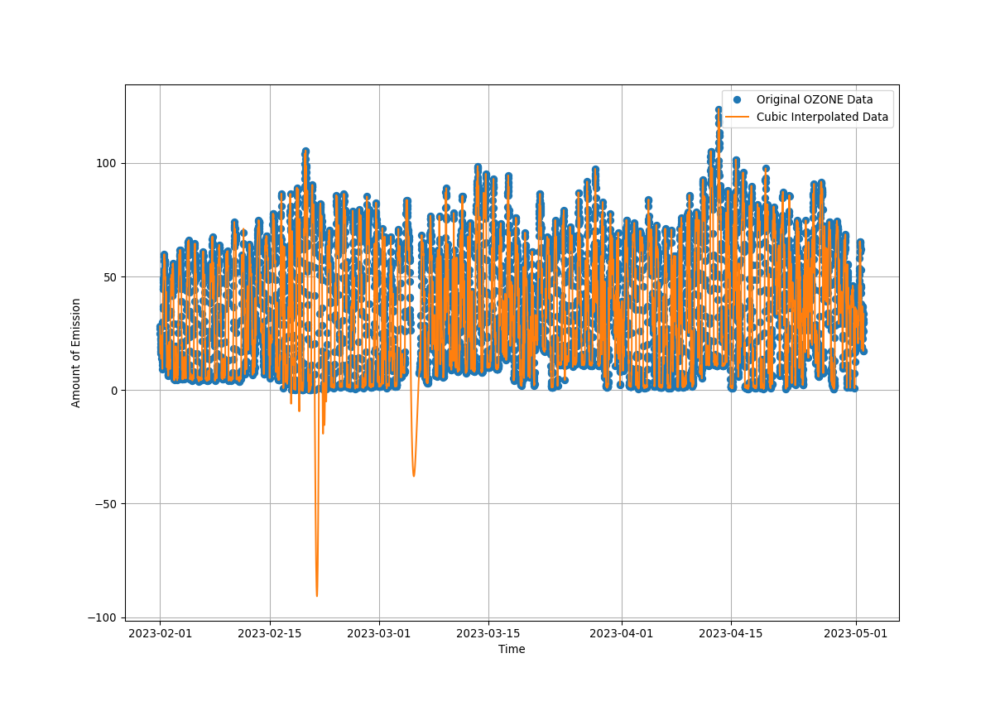

In [76]:
%matplotlib notebook
plt.plot(df.index, df['OZONE (µg/m3)'], 'o', label='Original OZONE Data')
plt.plot(df.index , new_df_OZONE, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [13]:
#cubic spline interpolation
spline_OZONE = df['OZONE (µg/m3)'].interpolate(method = "spline", order = 3)
spline_OZONE

From
2023-02-01 00:00:00    28.1
2023-02-01 00:15:00    27.1
2023-02-01 00:30:00    24.9
2023-02-01 00:45:00    21.9
2023-02-01 01:00:00    16.7
                       ... 
2023-05-01 22:45:00    26.1
2023-05-01 23:00:00    30.9
2023-05-01 23:15:00    29.6
2023-05-01 23:30:00    30.0
2023-05-01 23:45:00    33.5
Name: OZONE (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


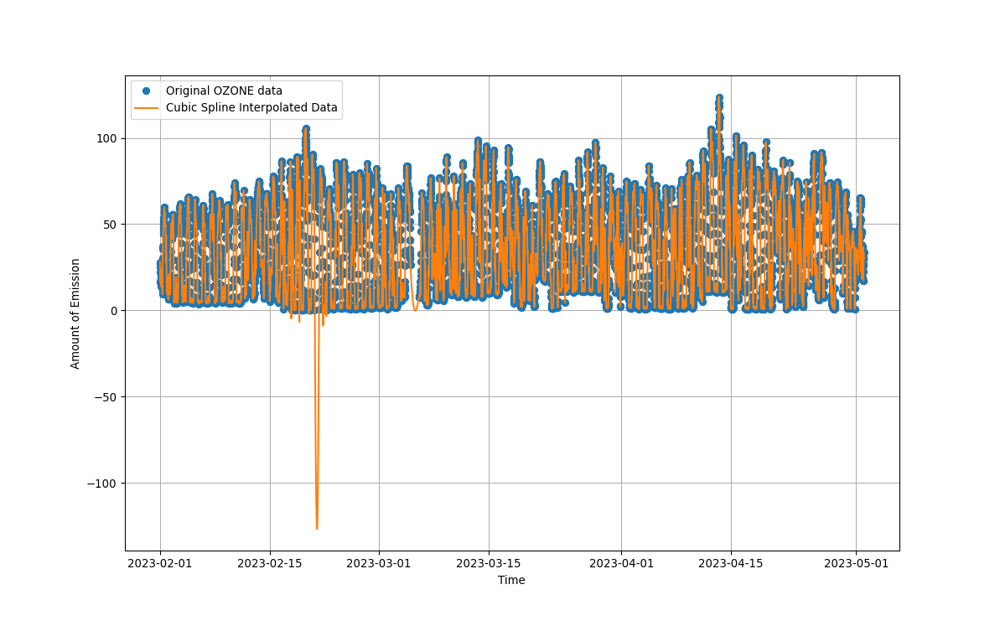

In [78]:
%matplotlib notebook
plt.plot(df.index, df['OZONE (µg/m3)'], 'o', label='Original OZONE data')
plt.plot(df.index, spline_OZONE, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


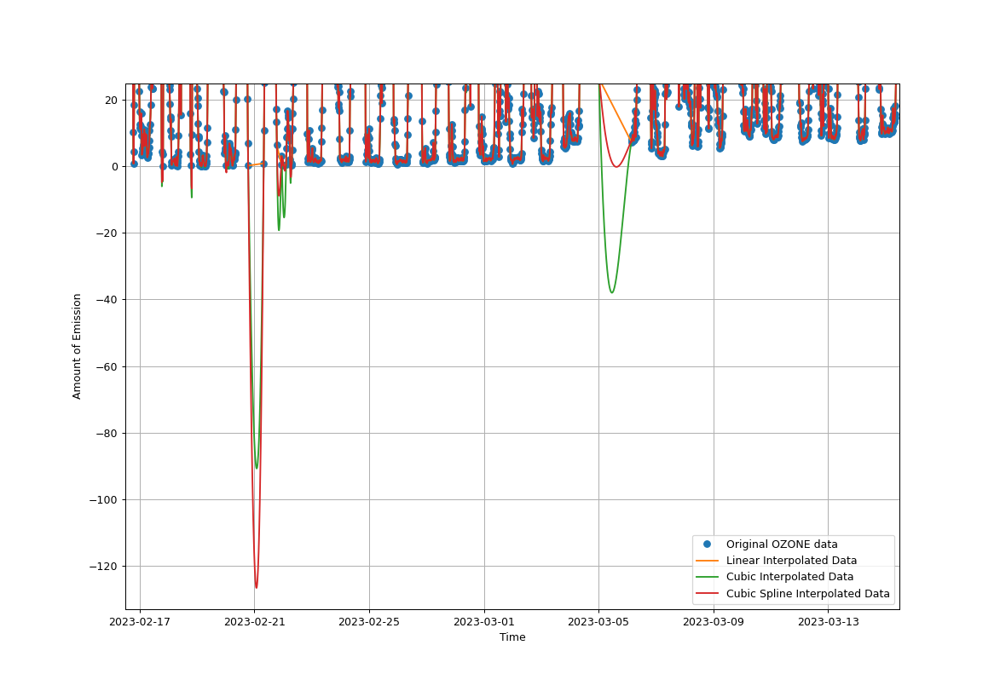

In [14]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['OZONE (µg/m3)'], 'o', label='Original OZONE data')
plt.plot(df.index , new_df_OZONE_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_OZONE, label='Cubic Interpolated Data')
plt.plot(df.index, spline_OZONE, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Linear Interpolation is the best for OZONE as cubic and cubic spline give negative values of density at some points which is not possible.

## Interpolation of BENZENE

In [80]:
#cubic spline interpolation
spline_BENZENE = df['BENZENE (µg/m3)'].interpolate(method = "spline", order = 3)
spline_BENZENE

From
2023-02-01 00:00:00    0.4
2023-02-01 00:15:00    0.4
2023-02-01 00:30:00    0.4
2023-02-01 00:45:00    0.4
2023-02-01 01:00:00    0.4
                      ... 
2023-05-01 22:45:00    0.1
2023-05-01 23:00:00    0.1
2023-05-01 23:15:00    0.1
2023-05-01 23:30:00    0.1
2023-05-01 23:45:00    0.1
Name: BENZENE (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


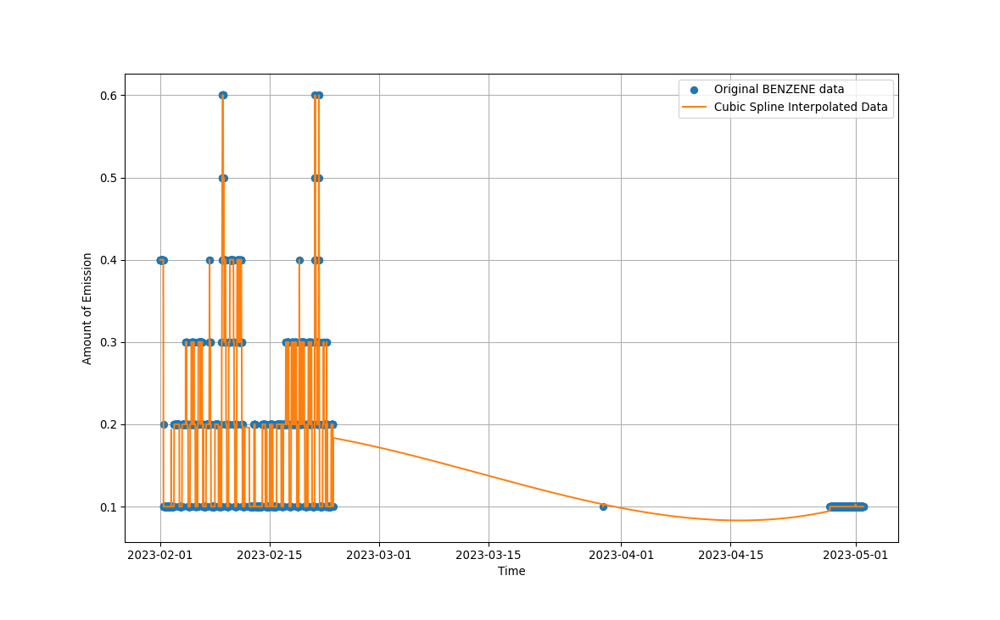

In [81]:
%matplotlib notebook
plt.plot(df.index, df['BENZENE (µg/m3)'], 'o', label='Original BENZENE data')
plt.plot(df.index, spline_BENZENE, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [82]:
#cubic interpolation
new_df_BENZENE = df['BENZENE (µg/m3)'].interpolate(method="cubic")
new_df_BENZENE

From
2023-02-01 00:00:00    0.4
2023-02-01 00:15:00    0.4
2023-02-01 00:30:00    0.4
2023-02-01 00:45:00    0.4
2023-02-01 01:00:00    0.4
                      ... 
2023-05-01 22:45:00    0.1
2023-05-01 23:00:00    0.1
2023-05-01 23:15:00    0.1
2023-05-01 23:30:00    0.1
2023-05-01 23:45:00    0.1
Name: BENZENE (µg/m3), Length: 8640, dtype: float64

In [83]:
new_df_BENZENE.isnull().sum()

0

<IPython.core.display.Javascript object>


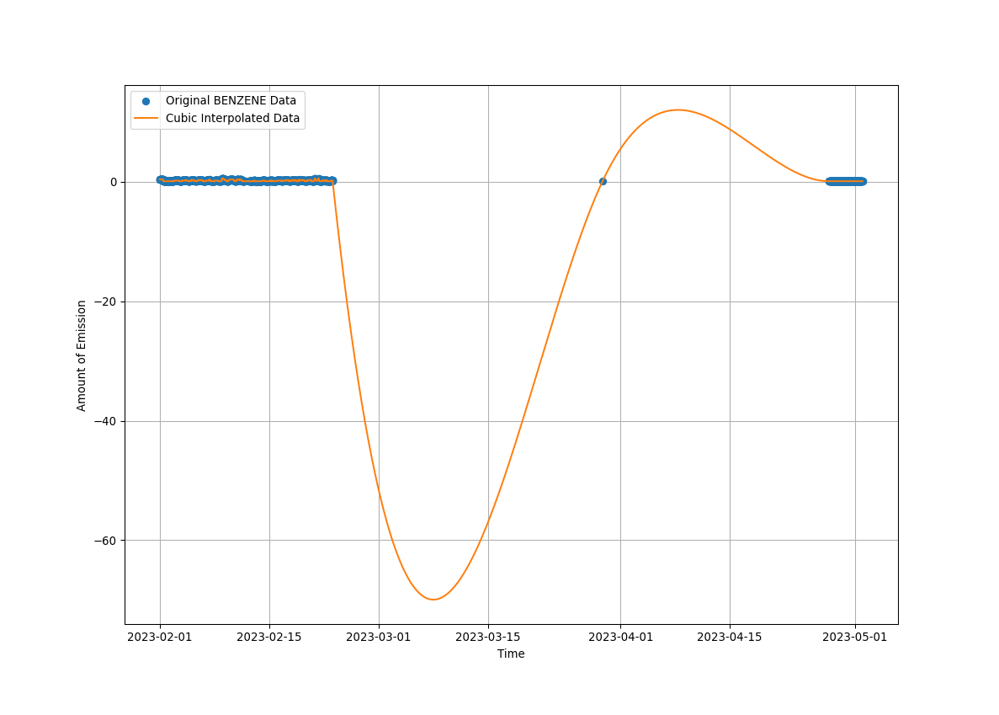

In [84]:
%matplotlib notebook
plt.plot(df.index, df['BENZENE (µg/m3)'], 'o', label='Original BENZENE Data')
plt.plot(df.index , new_df_BENZENE, label='Cubic Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

In [85]:
#linear interpolation
new_df_BENZENE_l = df['BENZENE (µg/m3)'].interpolate(method="linear")
new_df_BENZENE_l

From
2023-02-01 00:00:00    0.4
2023-02-01 00:15:00    0.4
2023-02-01 00:30:00    0.4
2023-02-01 00:45:00    0.4
2023-02-01 01:00:00    0.4
                      ... 
2023-05-01 22:45:00    0.1
2023-05-01 23:00:00    0.1
2023-05-01 23:15:00    0.1
2023-05-01 23:30:00    0.1
2023-05-01 23:45:00    0.1
Name: BENZENE (µg/m3), Length: 8640, dtype: float64

<IPython.core.display.Javascript object>


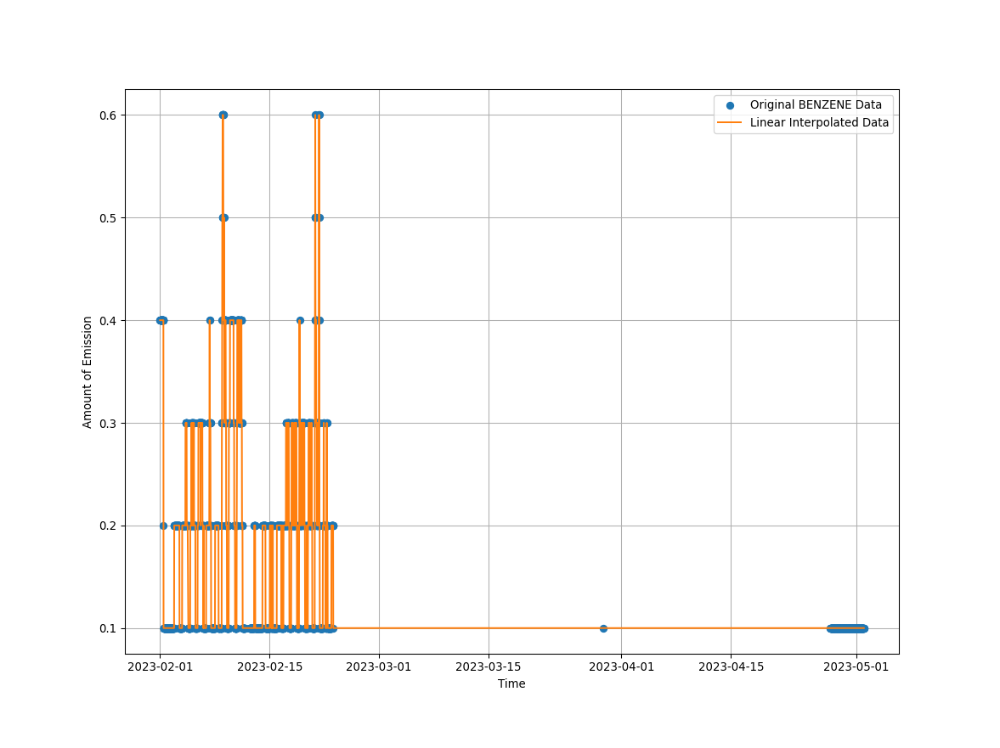

In [86]:
%matplotlib notebook
plt.plot(df.index, df['BENZENE (µg/m3)'], 'o', label='Original BENZENE Data')
plt.plot(df.index , new_df_BENZENE_l, label='Linear Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

<IPython.core.display.Javascript object>


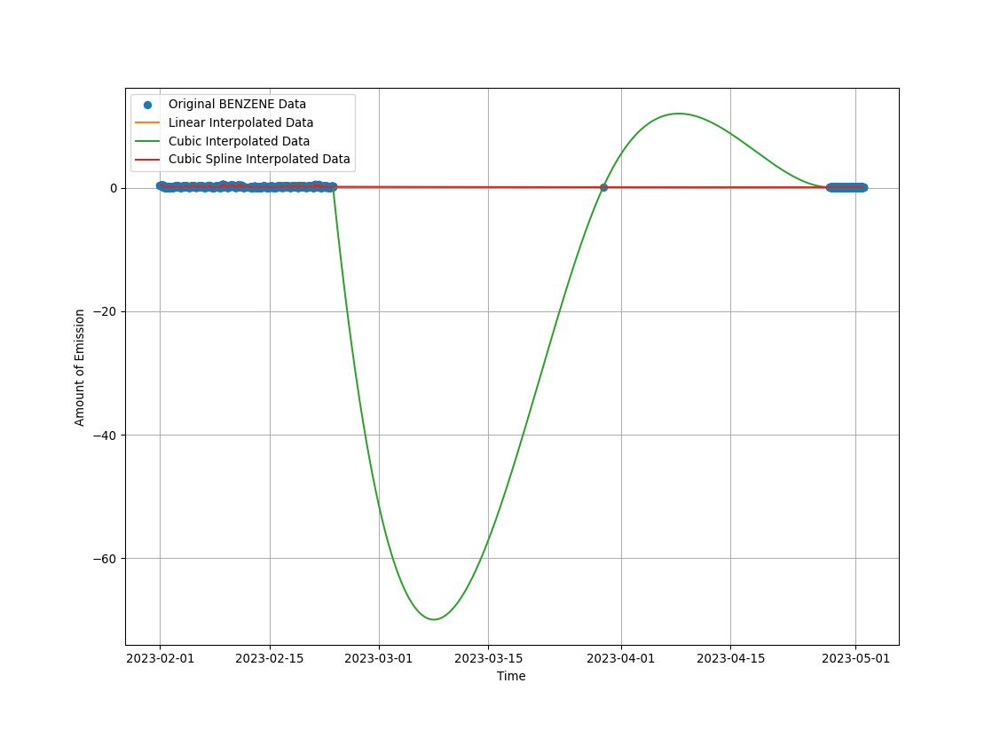

In [87]:
#comparing the interpolations
%matplotlib notebook
plt.plot(df.index, df['BENZENE (µg/m3)'], 'o', label='Original BENZENE Data')
plt.plot(df.index , new_df_BENZENE_l, label='Linear Interpolated Data')
plt.plot(df.index , new_df_BENZENE, label='Cubic Interpolated Data')
plt.plot(df.index, spline_BENZENE, label='Cubic Spline Interpolated Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

Since we see seasonality in the first month of the data, we conclude that we would see such seasonality in other months too, 
hence, we replace the nan values with previous months data and then we linear interpolate for what's still missing.

In [47]:
df['int_ben']=0
df['int_ben']

From
2023-02-01 00:00:00    0
2023-02-01 00:15:00    0
2023-02-01 00:30:00    0
2023-02-01 00:45:00    0
2023-02-01 01:00:00    0
                      ..
2023-05-01 22:45:00    0
2023-05-01 23:00:00    0
2023-05-01 23:15:00    0
2023-05-01 23:30:00    0
2023-05-01 23:45:00    0
Name: int_ben, Length: 8640, dtype: int64

In [48]:
df.index[2688]

Timestamp('2023-03-01 00:00:00')

In [49]:
df.index[5664]

Timestamp('2023-04-01 00:00:00')

In [50]:
for x in range(8640):
    if x >= 0 and x < 2688:
        df.loc[df.index[x], 'int_ben'] = df.loc[df.index[x], 'BENZENE (µg/m3)']
    elif x >= 2688 and x < 5664:
        if np.isnan(df.loc[df.index[x], 'BENZENE (µg/m3)']):
            df.loc[df.index[x], 'int_ben'] = df.loc[df.index[x - 2688], 'BENZENE (µg/m3)']
        else:
            df.loc[df.index[x], 'int_ben'] = df.loc[df.index[x], 'BENZENE (µg/m3)']
    else:
        if np.isnan(df.loc[df.index[x], 'BENZENE (µg/m3)']):
            df.loc[df.index[x], 'int_ben'] = df.loc[df.index[x - 5664], 'BENZENE (µg/m3)']
        else:
            df.loc[df.index[x], 'int_ben'] = df.loc[df.index[x], 'BENZENE (µg/m3)']

In [51]:
df['int_ben'].isnull().sum()

2129

In [52]:
new_df_BENZENE_seasonal = df['int_ben'].interpolate(method="linear")

<IPython.core.display.Javascript object>


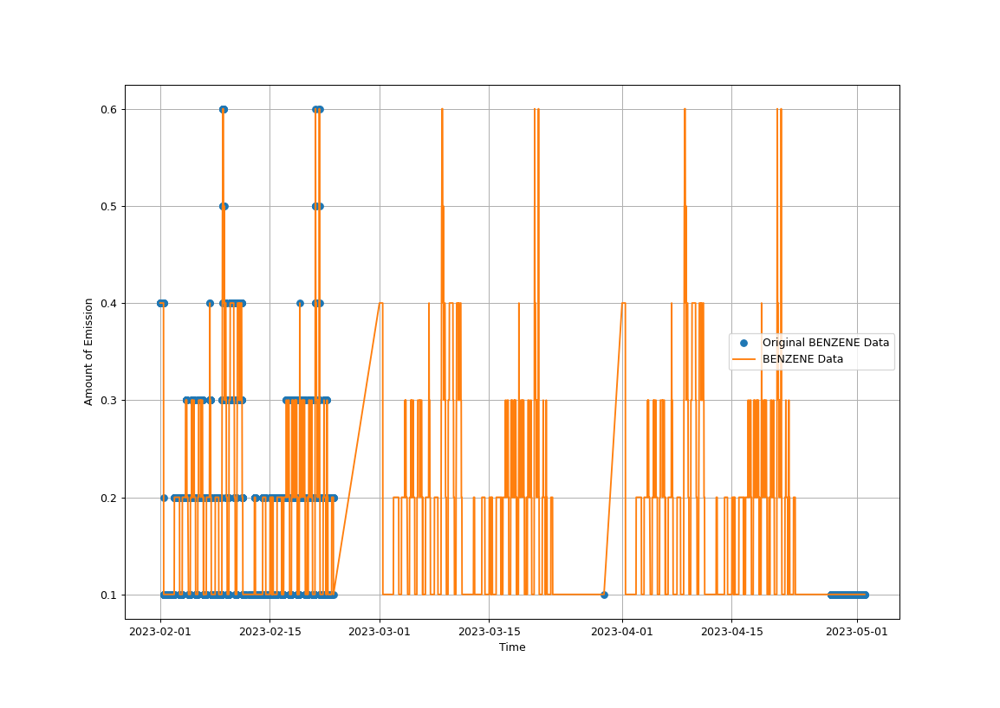

In [21]:
%matplotlib notebook
plt.plot(df.index, df['BENZENE (µg/m3)'], 'o', label='Original BENZENE Data')
plt.plot(df.index, new_df_BENZENE_seasonal, label='BENZENE Data')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.grid()
plt.legend()

This interpolation using seasonality is the best for Benzene.

## Plot of Total Interpolated Data

<IPython.core.display.Javascript object>


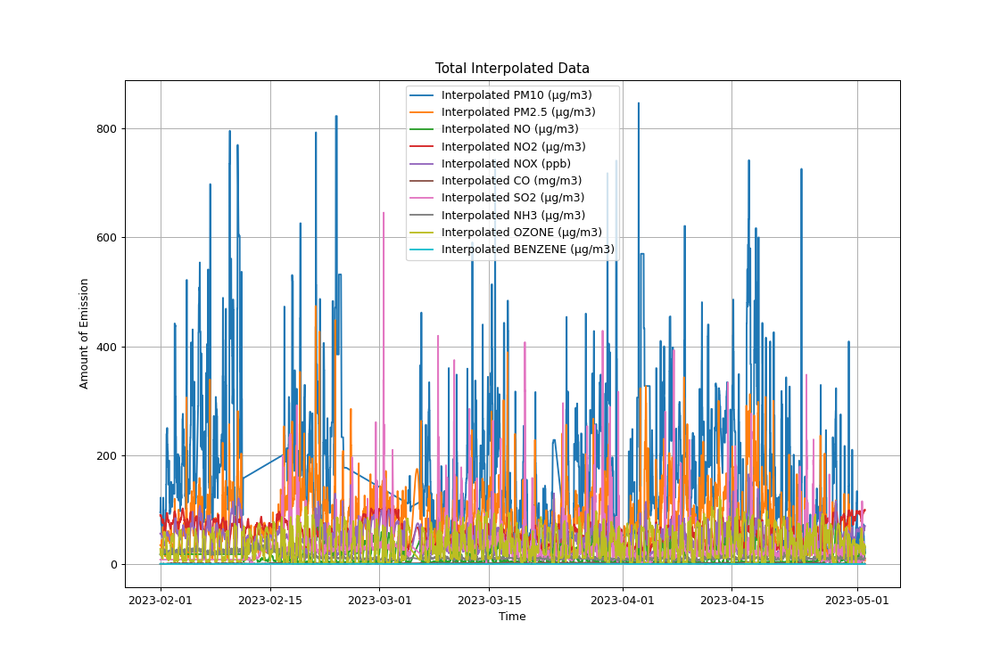

In [53]:
%matplotlib notebook
plt.plot(df.index , new_df_PM10_l, label='Interpolated PM10 (µg/m3)')
plt.plot(df.index , new_df_PM25, label='Interpolated PM2.5 (µg/m3)')
plt.plot(df.index , new_df_NO_l, label='Interpolated NO (µg/m3)')
plt.plot(df.index , spline_NO2, label='Interpolated NO2 (µg/m3)')
plt.plot(df.index , spline_NOX, label='Interpolated NOX (ppb)')
plt.plot(df.index , spline_CO, label='Interpolated CO (mg/m3)')
plt.plot(df.index , new_df_SO2_l, label='Interpolated SO2 (µg/m3)')
plt.plot(df.index , new_df_NH3_l, label='Interpolated NH3 (µg/m3)')
plt.plot(df.index , new_df_OZONE_l, label='Interpolated OZONE (µg/m3)')
plt.plot(df.index , new_df_BENZENE_seasonal, label='Interpolated BENZENE (µg/m3)')
plt.xlabel('Time')
plt.ylabel('Amount of Emission')
plt.title('Total Interpolated Data')
plt.grid()
plt.legend()

In [58]:
#froming a dataframe of interpolated values for further analysis.
data_i = {'PM10 (µg/m3)': new_df_PM10_l, 'PM2.5 (µg/m3)': new_df_PM25, 'NO (µg/m3)': new_df_NO_l, 'NO2 (µg/m3)': spline_NO2, 'NOX (ppb)': spline_NOX, 'CO (mg/m3)': spline_CO, 'SO2 (µg/m3)': new_df_SO2_l, 'NH3 (µg/m3)': new_df_NH3_l, 'OZONE (µg/m3)': new_df_OZONE_l, 'BENZENE (µg/m3)': new_df_BENZENE_seasonal}
int_df = pd.DataFrame(data_i)
int_df

,PM10 (µg/m3),PM2.5 (µg/m3),NO (µg/m3),NO2 (µg/m3),NOX (ppb),CO (mg/m3),SO2 (µg/m3),NH3 (µg/m3),OZONE (µg/m3),BENZENE (µg/m3)
From,,,,,,,,,,
2023-02-01 00:00:00,95.0,35.0,18.1,90.1,56.2,0.310000,8.2,17.7,28.1,0.4
2023-02-01 00:15:00,95.0,35.0,18.1,88.0,55.1,0.330000,8.2,18.3,27.1,0.4
2023-02-01 00:30:00,95.0,35.0,18.1,87.7,55.2,0.380000,8.2,19.7,24.9,0.4
2023-02-01 00:45:00,122.0,34.0,18.1,88.9,55.7,0.380000,8.2,21.3,21.9,0.4
2023-02-01 01:00:00,122.0,34.0,18.1,90.0,55.8,0.380000,8.2,22.3,16.7,0.4
...,...,...,...,...,...,...,...,...,...,...
2023-05-01 22:45:00,19.0,11.0,17.9,100.0,67.8,0.630000,10.0,10.7,26.1,0.1
2023-05-01 23:00:00,19.0,11.0,17.9,100.0,67.7,0.570000,10.0,10.4,30.9,0.1
2023-05-01 23:15:00,19.0,11.0,19.6,100.2,69.2,0.580000,9.9,10.5,29.6,0.1


In [59]:
int_df.index

DatetimeIndex(['2023-02-01 00:00:00', '2023-02-01 00:15:00',
               '2023-02-01 00:30:00', '2023-02-01 00:45:00',
               '2023-02-01 01:00:00', '2023-02-01 01:15:00',
               '2023-02-01 01:30:00', '2023-02-01 01:45:00',
               '2023-02-01 02:00:00', '2023-02-01 02:15:00',
               ...
               '2023-05-01 21:30:00', '2023-05-01 21:45:00',
               '2023-05-01 22:00:00', '2023-05-01 22:15:00',
               '2023-05-01 22:30:00', '2023-05-01 22:45:00',
               '2023-05-01 23:00:00', '2023-05-01 23:15:00',
               '2023-05-01 23:30:00', '2023-05-01 23:45:00'],
              dtype='datetime64[ns]', name='From', length=8640, freq=None)

In [61]:
int_df.to_csv('Interpolated Df.csv', index=True)